In [1]:
import tweepy
import time
from collections import defaultdict
from tweepy import TweepError

In [2]:
import nltk
nltk.download()
from nltk.classify import NaiveBayesClassifier
from nltk.corpus import subjectivity
from nltk.sentiment import SentimentAnalyzer
from nltk.sentiment.util import *

showing info https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml


/Users/christinahill/anaconda2/lib/python2.7/site-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


In [3]:
# New Twitter App
consumer_key = "xzSxeuO5GSQgZs3NwVIQrpF0S"
consumer_secret = "w4aRpCMP6sA24eZdU5HHYH2SZrPSPIgFZSTCHhSjdDN8Eusg0r"
access_token = "30304291-bQzWBtaXNBe4FG0L9Nbcq14p7WGYJjl84liBvT3YC"
access_token_secret = "WUtyRsPtsZnmDY99t7dSxnPSqDxpfwitplYzZwGBfFFPa"
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)

# Download tweets regarding Donald Trump
input_queries = ['Donald Trump']
download_tweet_count = 10000 # number of tweets we want to collect
tweetsPerQry = 100
sinceId = None
max_id = -1L

dataset = defaultdict(list)
for input_query in input_queries:
    print(input_query)
    counter = 0
    while counter < download_tweet_count:
       try:
           if (max_id <= 0):
               if (not sinceId):
                   new_tweets = api.search(q=input_queries, count=tweetsPerQry)
               else:
                   new_tweets = api.search(q=input_queries, count=tweetsPerQry, since_id=sinceId)
           else:
               if (not sinceId):
                   new_tweets = api.search(q=input_queries, count=tweetsPerQry, max_id=str(max_id - 1))
               else:
                   new_tweets = api.search(q=input_queries, count=tweetsPerQry, max_id=str(max_id - 1), since_id=sinceId)
           for tweet in new_tweets:
               dataset['topic'].append(input_query)
               dataset['id'].append(tweet.id)
               # user related information
               dataset['username'].append(tweet.author.screen_name)
               dataset['name'].append(tweet.author.name)
               dataset['user_followers_count'].append(tweet.author.followers_count)
               dataset['user_friends_count'].append(tweet.author.friends_count)
               # tweet related information
               dataset['text'].append(tweet.text)
               dataset['created_at'].append(tweet.created_at.strftime("%Y-%m-%d %H:%M:%S"))
               dataset['favorite_count'].append(tweet.favorite_count)
               dataset['retweet_count'].append(tweet.retweet_count)
               # some extracted data from tweet
               dataset['hashtags'].append(','.join([ht['text'] for ht in tweet.entities['hashtags']]))
               dataset['mentioned_urls'].append(','.join([url['url'] for url in tweet.entities['urls']]))
               dataset['mentioned_user_ids'].append(','.join([mention['id_str'] for mention in tweet.entities['user_mentions']]))
               dataset['mentioned_user_names'].append(','.join([mention['screen_name'] for mention in tweet.entities['user_mentions']]))
           counter +=len(new_tweets)
           max_id = new_tweets[-1].id
           if counter == download_tweet_count: break
       except TweepError:
           print(len(dataset['id']))
           print('Sleeping for 15 minutes')
           time.sleep(15*60) # sleep for 15 minutes

Donald Trump


In [4]:
#Write tweet objects to JSON file
file = open('tweet.json', 'wb') 
print "Writing tweet objects to JSON please wait..."
for status in new_tweets:
    json.dump(status._json,file,sort_keys = True,indent = 4)
    
#close the file
print "Done"
file.close()

Writing tweet objects to JSON please wait...
Done


In [5]:
import pandas as pd
dt = pd.DataFrame.from_dict(dataset)
dt[['created_at','text','hashtags','username','user_followers_count']].head(50)

,created_at,text,hashtags,username,user_followers_count
0,2018-04-04 02:00:47,RT @cwebbonline: I have a love hate relationsh...,TeamAmazon,realbillm,328
1,2018-04-04 02:00:47,RT @SarahWhalen7: Post: Danity Kane singer Aub...,,DianeMo24012416,6624
2,2018-04-04 02:00:45,RT @leftyjennyc: Message for the BernieCult: i...,,CaliforniaGram,1102
3,2018-04-04 02:00:45,RT @middleageriot: The difference between Dona...,,JujunluluJudy,791
4,2018-04-04 02:00:44,Donald Trump ‘Cherishes’ Lou Dobbs So Much He ...,,pdougmc,346
5,2018-04-04 02:00:44,"RT @Kevin_Shipp: On several fronts, the Shadow...",,solen_yanda,3086
6,2018-04-04 02:00:43,RT @qz: Amazon Prime is more popular than Dona...,,SGC_coffee,1122
7,2018-04-04 02:00:42,Pence barged into the room and caught them bot...,,porkyvid,42
8,2018-04-04 02:00:42,RT @ProudResister: Donald Trump: “Nobody has b...,,1549321s,836
9,2018-04-04 02:00:41,RT @ProudResister: Our Country has had 45 pres...,,lcrosleyotts194,112


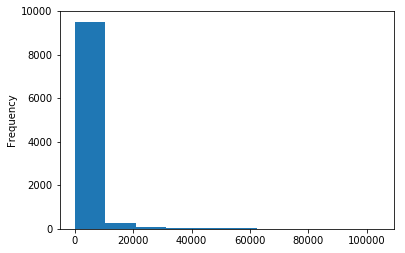

In [6]:
import numpy as np
import matplotlib.pyplot as plt
filtered_dt = dt[dt['user_followers_count'] <= np.percentile(dt['user_followers_count'],99)]
filtered_dt['user_followers_count'].plot.hist()
plt.show()

In [7]:
from collections import Counter
hashtag_counter = Counter()
for hts in dt['hashtags'].values:
    hts = hts.split(',')
    hashtag_counter.update(hts)
    
import operator
sorted_cntr = sorted(hashtag_counter.items(), key=operator.itemgetter(1),reverse=True)
print(sorted_cntr[0:50])

[('', 9054), (u'TrumpRussia', 319), (u'Trump', 99), (u'MAGA', 72), (u'Roseanne', 52), (u'TeamAmazon', 35), (u'TheResistance', 30), (u'PromisesKept', 29), (u'EEUU', 28), (u'KAG', 19), (u'M\xe9xico', 19), (u'Amazon', 18), (u'DonaldTrump', 18), (u'MarchForTruth', 17), (u'SmartNews', 15), (u'BuildTheWall', 15), (u'Siria', 14), (u'AMLO', 13), (u'Video', 13), (u'Coahuila', 13), (u'Master', 12), (u'TrumpOut', 11), (u'NotMyPresident', 11), (u'tx2018', 8), (u'ttevents', 8), (u'GetOutTheVote', 7), (u'FakeNews', 7), (u'YouTube', 7), (u'QAnon', 6), (u'ProjectConnectSA', 6), (u'2A', 6), (u'WhiteGenocide', 6), (u'TuesdayThoughts', 6), (u'LifeGoalsIn5Words', 6), (u'USA', 6), (u'DACA', 6), (u'Maddow', 5), (u'Newsmax', 5), (u'BigBrother', 5), (u'UrgQue', 5), (u'Russia', 5), (u'AmericaFirst', 5), (u'fakenews', 4), (u'ItsMuellerTime', 4), (u'Tucker', 4), (u'MobileGame', 4), (u'TrumpWall', 4), (u'Duh', 4), (u'Mueller', 4), (u'Chicano', 4)]


In [8]:
n_instances = 2000
subj_docs = [(sent, 'subj') for sent in subjectivity.sents(categories='subj')[:n_instances]]
obj_docs = [(sent, 'obj') for sent in subjectivity.sents(categories='obj')[:n_instances]]
len(subj_docs), len(obj_docs)

(2000, 2000)

In [9]:
subj_docs[0]
(dataset['text'], 'subj')

([u'RT @cwebbonline: I have a love hate relationship with Amazon, but what President loco is doing is wrong. I\u2019m definitely #TeamAmazon in this\u2026',
  u"RT @SarahWhalen7: Post: Danity Kane singer\xa0Aubrey O'Day, who allegedly had an affair with Donald Jr, shared a ... https://t.co/rxeFZ6Rued v\u2026",
  u'RT @leftyjennyc: Message for the BernieCult: if you honestly think a Hillary presidency would in ANY way resemble what we are seeing from D\u2026',
  u"RT @middleageriot: The difference between Donald Trump and other Republicans is that Trump hasn't figured out he can make it more difficult\u2026",
  u'Donald Trump \u2018Cherishes\u2019 Lou Dobbs So Much He Puts Him on Speakerphone for Oval Office Meetings https://t.co/tZcDfg8Jui',
  u'RT @Kevin_Shipp: On several fronts, the Shadow Government program is unraveling.The deeply orchestrated effort to eliminate Donald Trump is\u2026',
  u'RT @qz: Amazon Prime is more popular than Donald Trump https://t.co/MdXQVvA33S',
  u'Pence b

In [10]:
# NLTK train classifier
train_subj_docs = subj_docs[:800]
test_subj_docs = subj_docs[800:1000]
train_obj_docs = obj_docs[:800]
test_obj_docs = obj_docs[800:1000]
training_docs = train_subj_docs+train_obj_docs
testing_docs = test_subj_docs+test_obj_docs
sentim_analyzer = SentimentAnalyzer()
all_words_neg = sentim_analyzer.all_words([mark_negation(doc) for doc in training_docs])

In [11]:
unigram_feats = sentim_analyzer.unigram_word_feats(all_words_neg, min_freq=4)
len(unigram_feats)
sentim_analyzer.add_feat_extractor(extract_unigram_feats, unigrams=unigram_feats)

In [12]:
training_set = sentim_analyzer.apply_features(training_docs)
test_set = sentim_analyzer.apply_features(testing_docs)

In [13]:
trainer = NaiveBayesClassifier.train
classifier = sentim_analyzer.train(trainer, training_set)
for key,value in sorted(sentim_analyzer.evaluate(test_set).items()):
     print('{0}: {1}'.format(key, value))

Training classifier
Evaluating NaiveBayesClassifier results...
Accuracy: 0.835
F-measure [obj]: 0.826315789474
F-measure [subj]: 0.842857142857
Precision [obj]: 0.872222222222
Precision [subj]: 0.804545454545
Recall [obj]: 0.785
Recall [subj]: 0.885


In [14]:
# Test sentiment from example
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sentences = ["Donald Trump is smart, handsome, and funny.", # positive sentence example
"Donald Trump is smart, handsome, and funny!", # punctuation emphasis handled correctly (sentiment intensity adjusted)
"Donald Trump is very smart, handsome, and funny.",  # booster words handled correctly (sentiment intensity adjusted)
"Donald Trump is VERY SMART, handsome, and FUNNY.",  # emphasis for ALLCAPS handled
"Donald Trump is VERY SMART, handsome, and FUNNY!!!",# combination of signals - VADER appropriately adjusts intensity
"Donald Trump is VERY SMART, really handsome, and INCREDIBLY FUNNY!!!",# booster words & punctuation make this close to ceiling for score
"The book was good.",         # positive sentence
"The book was kind of good.", # qualified positive sentence is handled correctly (intensity adjusted)
"The plot was good, but the characters are uncompelling and the dialog is not great.", # mixed negation sentence
"A really bad, horrible book.",       # negative sentence with booster words
"At least it isn't a horrible book.", # negated negative sentence with contraction
":) and :D",     # emoticons handled
"",              # an empty string is correctly handled
"Today sux",     #  negative slang handled
"Today sux!",    #  negative slang with punctuation emphasis handled
"Today SUX!",    #  negative slang with capitalization emphasis
"Today kinda sux! But I'll get by, lol" # mixed sentiment example with slang and constrastive conjunction "but"
]

paragraph = "It was one of the worst movies I've seen, despite good reviews. Unbelievably bad acting!! Poor direction. VERY poor production. The movie was bad. Very bad movie. VERY bad movie. VERY BAD movie. VERY BAD movie!"

from nltk import tokenize
lines_list = tokenize.sent_tokenize(paragraph)
sentences.extend(lines_list)
tricky_sentences = [
"Most automated sentiment analysis tools are shit.",
"Donald Trump sentiment analysis is the shit.",
"Sentiment analysis has never been good.",
"Sentiment analysis with Donald Trump has never been this good.",
"Warren Beatty has never been so entertaining.",
"I won't say that the movie is astounding and I wouldn't claim that the movie is too banal either.",
"I like to hate Michael Bay films, but I couldn't fault this one",
"It's one thing to watch an Uwe Boll film, but another thing entirely to pay for it",
"The movie was too good",
"This movie was actually neither that funny, nor super witty.",
"This movie doesn't care about cleverness, wit or any other kind of intelligent humor.",
"Those who find ugly meanings in beautiful things are corrupt without being charming.",
"There are slow and repetitive parts, BUT it has just enough spice to keep it interesting.",
"The script is not fantastic, but the acting is decent and the cinematography is EXCELLENT!",
"Roger Dodger is one of the most compelling variations on this theme.",
"Roger Dodger is one of the least compelling variations on this theme.",
"Roger Dodger is at least compelling as a variation on the theme.",
"they fall in love with the product",
"but then it breaks",
"usually around the time the 90 day warranty expires",
"the twin towers collapsed today",
"However, Mr. Carter solemnly argues, his client carried out the kidnapping \
under orders and in the ''least offensive way possible.''"]

sentences.extend(tricky_sentences)

sid = SentimentIntensityAnalyzer()
for sentence in sentences:
     print(sentence)
     ss = sid.polarity_scores(sentence)
     for k in sorted(ss):
         print('{0}: {1},'.format(k, ss[k]))

Donald Trump is smart, handsome, and funny.
compound: 0.8316,
neg: 0.0,
neu: 0.313,
pos: 0.688,
Donald Trump is smart, handsome, and funny!
compound: 0.8439,
neg: 0.0,
neu: 0.306,
pos: 0.694,
Donald Trump is very smart, handsome, and funny.
compound: 0.8545,
neg: 0.0,
neu: 0.348,
pos: 0.652,
Donald Trump is VERY SMART, handsome, and FUNNY.
compound: 0.9227,
neg: 0.0,
neu: 0.29,
pos: 0.71,
Donald Trump is VERY SMART, handsome, and FUNNY!!!
compound: 0.9342,
neg: 0.0,
neu: 0.276,
pos: 0.724,
Donald Trump is VERY SMART, really handsome, and INCREDIBLY FUNNY!!!
compound: 0.9469,
neg: 0.0,
neu: 0.327,
pos: 0.673,
The book was good.
compound: 0.4404,
neg: 0.0,
neu: 0.508,
pos: 0.492,
The book was kind of good.
compound: 0.3832,
neg: 0.0,
neu: 0.657,
pos: 0.343,
The plot was good, but the characters are uncompelling and the dialog is not great.
compound: -0.7042,
neg: 0.327,
neu: 0.579,
pos: 0.094,
A really bad, horrible book.
compound: -0.8211,
neg: 0.791,
neu: 0.209,
pos: 0.0,
At least it i

In [15]:
#NLTK Vader Sentiment Analysis on dataset
for sentence in dataset['text']:
     print(sentence)
     ss = sid.polarity_scores(sentence)
     for k in sorted(ss):
         print('{0}: {1},'.format(k, ss[k]))

RT @cwebbonline: I have a love hate relationship with Amazon, but what President loco is doing is wrong. I’m definitely #TeamAmazon in this…
compound: -0.0,
neg: 0.217,
neu: 0.533,
pos: 0.25,
RT @SarahWhalen7: Post: Danity Kane singer Aubrey O'Day, who allegedly had an affair with Donald Jr, shared a ... https://t.co/rxeFZ6Rued v…
compound: 0.34,
neg: 0.0,
neu: 0.882,
pos: 0.118,
RT @leftyjennyc: Message for the BernieCult: if you honestly think a Hillary presidency would in ANY way resemble what we are seeing from D…
compound: 0.4588,
neg: 0.0,
neu: 0.88,
pos: 0.12,
RT @middleageriot: The difference between Donald Trump and other Republicans is that Trump hasn't figured out he can make it more difficult…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
Donald Trump ‘Cherishes’ Lou Dobbs So Much He Puts Him on Speakerphone for Oval Office Meetings https://t.co/tZcDfg8Jui
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @Kevin_Shipp: On several fronts, the Shadow Government program is unrave

RT @ProudResister: Donald Trump just proposed sending the Military to guard the southern border. Can someone please advise this f*cking mor…
compound: 0.3182,
neg: 0.0,
neu: 0.897,
pos: 0.103,
RT @2018DemWave: Retreating from the White House for a three-night stay at his Florida estate, Trump heard this weekend from a parade of al…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @candiceferrette: Mondello to give up jobs paying nearly $2M if confirmed https://t.co/JV89oLmi2t via @newsday
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @tonyposnanski: Things that have a higher approval rating than Donald Trump...

- Crocs with white socks
- Nickelback
- Miracle Whip
- T…
compound: 0.7845,
neg: 0.0,
neu: 0.711,
pos: 0.289,
RT @chuckwoolery: Donald Trump Could Pardon Julian Assange and Stop This Human Rights Violation Without a Trial https://t.co/imreXBCR7z htt…
compound: -0.4767,
neg: 0.238,
neu: 0.661,
pos: 0.101,
Donald #Trump calls on Congress again to pass immigration legislation. Co

neg: 0.0,
neu: 0.8,
pos: 0.2,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @4YrsToday: Donald Trump said Sinclair Broadcasting is far superior to CNN and NBC......

Do you agree?
compound: 0.7184,
neg: 0.0,
neu: 0.714,
pos: 0.286,
RT @qz: Amazon Prime is more popular than Donald Trump https://t.co/MdXQVvA33S
compound: 0.5849,
neg: 0.0,
neu: 0.653,
pos: 0.347,
RT @ProudResister: Donald Trump: “Nobody has been tougher on Russia than I have.”

— Trump Campaign had 70 contacts and 22 meetings with Ru…
compound: 0.1779,
neg: 0.0,
neu: 0.928,
pos: 0.072,
RT @realDonaldTrump: "@FiIibuster: @jeffzeleny Pathetic - you have no sufficient evidence that Donald Trump did not suffer from voter fraud…
compound: -0.4678,
neg: 0.238,
neu: 0.646,
pos: 0.115,
"Vamos a tener una relación respetuosa con el gobierno de EEUU y con el presidente Donald Trump, 

neg: 0.195,
neu: 0.805,
pos: 0.0,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @alain_4u: #الملك_سلمان يشيد بتأكيدات #ترامب ضرورة التصدي لـ #إيران
#عينك_على_العالم
رابـط الخبر | https://t.co/DShN5dF7Ra https://t.co/…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @Thomas1774Paine: Donald Trump Jr. Brought His Family to the WH Easter Egg Roll — The Pin He Wore Has Special Message https://t.co/fHqLd…
compound: 0.4019,
neg: 0.0,
neu: 0.891,
pos: 0.109,
@BradMossEsq @windmillcharger I'd love to see Jeff Bezos and Donald Trump do hand to hand combat, knives only, my money is on Bezos😂😂😂😂😂😂
compound: 0.8481,
neg: 0.075,
neu: 0.594,
pos: 0.331,
Here's How Donald Trump Could Make A Post-Brexit Trade Deal Even Harder For The UK-https://t.co/zUmYHB1fAJ
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @adamcbest: Donald Trump has cheated:

* On al

neg: 0.719,
neu: 0.281,
pos: 0.0,
My daughter is 6:

“Mommy do we vote for mayor?”
- yes
“Who’s the mayor now?”
- Marty Walsh 
“Is he good?”
- yea su… https://t.co/v457WiyIZb
compound: 0.5007,
neg: 0.0,
neu: 0.872,
pos: 0.128,
RT @PalmerReport: MSNBC analyst: Donald Trump is subject of Robert Mueller grand jury https://t.co/Lx2u3ILCcr
compound: 0.4588,
neg: 0.0,
neu: 0.813,
pos: 0.188,
RT @JimCarrey: Dear Smithsonian National Portrait Gallery @NPG, I know it’s early but I’d like to submit this as the official portrait of o…
compound: 0.6187,
neg: 0.0,
neu: 0.806,
pos: 0.194,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
@StarvingWriter_ @TeeBeeDee1 @MSNBC @BarackObama Let’s start from the beginning. It was the contents of the unfound… https://t.co/LqfXSlj2es
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @padresolalinde: Donald Trump truena

pos: 0.0,
RT @activist360: Did you hear that Donald? You're not a criminal target of the Mueller investigation! So what harm is there in an interview…
compound: -0.317,
neg: 0.146,
neu: 0.754,
pos: 0.1,
RT @InvestigateRU: Analysis | A new study suggests fake news might have won Donald Trump the 2016 election https://t.co/TelaZMHczk
compound: 0.1531,
neg: 0.142,
neu: 0.688,
pos: 0.17,
RT @Mision_Verdad: El nivel de influencia de la CIA en las decisiones de Donald Trump es bastante alto https://t.co/8GbR7NHI7K
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @TopRopeTravis: TERRIFYING: (Video) Watch when every Sinclair owned local news station broadcaster reads the same exact script in unison…
compound: -0.6633,
neg: 0.189,
neu: 0.811,
pos: 0.0,
@TranslateRealDT President Donald J. Trump declares "I have no idea what I'm talking about and have no means of und… https://t.co/r9DqUQ7H09
compound: -0.5267,
neg: 0.188,
neu: 0.812,
pos: 0.0,
Trump continues attacks on Amazon and Washington Post

RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @SanMateogirl11: 🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨❌❌❌❌❌❌❌❌❌❌❌❌ https://t.co/CA6mDgMfGo
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @ProudResister: Stocks have now lost more in the 2nd quarter of this year than in any year since the Great Depression. Donald Trump is g…
compound: -0.2263,
neg: 0.181,
neu: 0.695,
pos: 0.124,
RT @bulldoghill: President Donald Trump once mocked Jared Kushner to aides, saying his son-in-law and senior adviser looked like “a little…
compound: 0.0516,
neg: 0.097,
neu: 0.798,
pos: 0.105,
RT @MrDane1982: With Vice President Pence breaking tie, Senate passes anti-Planned Parenthood bill

Remember in 2016 Bernie Sanders, Donald…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @lukasbattle: “Are you ready to say something completely inappropriate and politically incorrect?”

Laura Ingraha

neg: 0.112,
neu: 0.678,
pos: 0.21,
RT @CNN: Stormy Daniels’ lawyer reacts to @sethrogen saying he knew about the alleged affair between the porn star and Donald Trump years a…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
@CNN Where are Donald’s tax returns?
Donald has cheated the U.S taxpayers for decades.

Complete financial disclosu… https://t.co/D5093ewG1t
compound: -0.5106,
neg: 0.163,
neu: 0.837,
pos: 0.0,
RT @SallyDeal4: No, the Postal Service isn't losing a fortune on Amazon

Twitterverse:  Please alert me when 45* says something that's true…
compound: 0.6351,
neg: 0.083,
neu: 0.602,
pos: 0.315,
RT @johnpavlovitz: "To hell with your phony Patriotism.
To hell with your fake religion.
To hell with your fear-peddling.
To hell with your…
compound: -0.9735,
neg: 0.544,
neu: 0.456,
pos: 0.0,
RT @SusResis: Destroy
Delete
Divorce
Disappoint
Death
Disaster
Debt
Disrupt
Demise
Depression
Demons
Deficit
Dubious
Diarrhea
Demolish
Doub…
compound: -0.9766,
neg: 0.719,
neu: 0.281,
pos: 0.0,
RT

neu: 0.734,
pos: 0.266,
@RealJamesWoods Thank God we finally have a president who speaks up and cares about American citizens God bless you Donald Trump
compound: 0.8885,
neg: 0.0,
neu: 0.545,
pos: 0.455,
RT @SenatorDurbin: .@CNNPolitics: If President Trump really wanted a DACA deal, there'd be a DACA deal https://t.co/oB072Tesl9
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @OutFrontCNN: "Donald Trump needs to call out Putin and say this behavior of yours, like trying to kill Skripal is not good." - Steve Ha…
compound: -0.4939,
neg: 0.156,
neu: 0.762,
pos: 0.083,
Donald Trump Mocked After He Can't Quite Describe The White House https://t.co/wFPn5wpYkN via @yahoo
compound: -0.3182,
neg: 0.15,
neu: 0.85,
pos: 0.0,
#TrumpLies       Trump declares 'nobody has been tougher on Russia' @CNNPolitics https://t.co/PZw21zqA09
compound: 0.1779,
neg: 0.0,
neu: 0.855,
pos: 0.145,
RT @adamcbest: Donald Trump has cheated:

* On all three of his wives
* Workers from pay
* His way out of Vietnam 
* D

neg: 0.142,
neu: 0.858,
pos: 0.0,
RT @TruthEqualsFact: @AugrEdmonton @seanthegritty @Ruetheday852 @SagArcher @cindyrelish @bettypge69 @dawnresist @kpeters4130 @NegusHamitic…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @InformadorVeraz: La sabandija iris varela dice que ella NO es la culpable de la masacre en PoliCarabobo. La sabandija rafael lacava dic…
compound: -0.4466,
neg: 0.118,
neu: 0.882,
pos: 0.0,
RT @bulldoghill: For several years now we've seen Donald Trump attack everyone from teenage girls to professional journalists to sitting se…
compound: -0.4767,
neg: 0.134,
neu: 0.866,
pos: 0.0,
RT @Thomas1774Paine: Donald Trump Jr. Brought His Family to the WH Easter Egg Roll — The Pin He Wore Has Special Message https://t.co/fHqLd…
compound: 0.4019,
neg: 0.0,
neu: 0.891,
pos: 0.109,
So bored I’m watching a documentary on Donald Trump 😅
compound: -0.3384,
neg: 0.23,
neu: 0.77,
pos: 0.0,
RT @adamcbest: Donald Trump has cheated:

* On all three of his wives
* Workers from pay
* His 

compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @Amy_Siskind: And voters who were carefully targeted by Cambridge Analytica and Russia:
“4 percent of President Barack Obama's 2012 supp…
compound: 0.128,
neg: 0.0,
neu: 0.93,
pos: 0.07,
RT @TorontoStar: Prime Minister Justin Trudeau’s government on Tuesday declined to offer an opinion on U.S. President Donald Trump’s decisi…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @middleageriot: The difference between Donald Trump and other Republicans is that Trump hasn't figured out he can make it more difficult…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
I added a video to a @YouTube playlist https://t.co/LxStjcHyto Jeff Bezos vs Donald Trump | Tarot Reading
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @OaktownRaidn: @nytimes America first, as a veteran of the military the greatest criminal and treat we have to OUR country IS Donald Tru…
compound: 0.5423,
neg: 0.112,
neu: 0.66,
pos: 0.228,
RT @padresolalinde: Donald Trump truena los dedo

neu: 0.741,
pos: 0.259,
RT @TrumpsDC: Awesome #Roseanne tonight!

@therealroseanne speaks to the average American just like Donald Trump does. 

And THAT is why th…
compound: 0.784,
neg: 0.0,
neu: 0.734,
pos: 0.266,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @PolitiFact: Contrary to @realDonaldTrump's claims, the Postal Service isn't losing a fortune on @Amazon. That's False. https://t.co/HZA…
compound: 0.2924,
neg: 0.0,
neu: 0.88,
pos: 0.12,
RT @BoycottUtah: It is Tuesday, April 3, 2018. One citizen, I humbly call for the resignation of Donald J Trump as President of the United…
compound: -0.296,
neg: 0.091,
neu: 0.909,
pos: 0.0,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
RT @Reporte_In

compound: -0.6705,
neg: 0.2,
neu: 0.8,
pos: 0.0,
RT @PalmerReport: Donald Trump’s day so far:

- Attacks Amazon
- Misspells “born”
- Attacks Jeff Zucker
- Misspells “Zucker”
- “Cheatin’ Ob…
compound: -0.659,
neg: 0.273,
neu: 0.643,
pos: 0.084,
RT @treasonstickers: Jeff Bezos: built the 2nd most valuable company on the planet and significantly altered the way Americans shop

Donald…
compound: 0.5256,
neg: 0.0,
neu: 0.855,
pos: 0.145,
@Col_TD I just scroll through his Twitter and every tweet is about Donald Trump his whole Twitter is dedicated to trump lmao
compound: 0.7845,
neg: 0.0,
neu: 0.734,
pos: 0.266,
RT @PolitiFact: Here are the facts to @realDonaldTrump's Mostly False claim about immigration laws in Mexico, United States https://t.co/Ud…
compound: 0.4215,
neg: 0.0,
neu: 0.865,
pos: 0.135,
RT @bulldoghill: For several years now we've seen Donald Trump attack everyone from teenage girls to professional journalists to sitting se…
compound: -0.4767,
neg: 0.134,
neu: 0.866,
pos: 0.0,

neg: 0.0,
neu: 1.0,
pos: 0.0,
Donald Trump quiere desplegar militares en la frontera con México https://t.co/uMnfzKBlrH
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @FrexB: The Caravan of Invaders stalls at a soccer field "unsure and anxious about the way forward."

“Now President Donald Trump has sa…
compound: -0.4588,
neg: 0.16,
neu: 0.84,
pos: 0.0,
RT @AlbertoRodNews: “Venezuela es el tema más urgente del continente en este momento”, dijo un funcionario del Departamento de Estado de EE…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
Can you imagine back in 2016 if Hillary would have the Stormy Daniels story and in a debate addressed Trump as “My… https://t.co/P9lqNY3ape
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @ivanzarak: Pareciera que Navarro está siguiendo la estrategia de Donald Trump: homofobia y xenofobia como pilares de campaña. Make Pana…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
'Quem assassinar policial receberá pena de morte', diz Donald Trump https://t.co/tgHAN

pos: 0.237,
RT @TIME: President Trump claims Amazon is costing the Post Office and taxpayers money. It's not https://t.co/bqNbwZaVGD
compound: 0.1779,
neg: 0.0,
neu: 0.904,
pos: 0.096,
RT @roryhtug: I saw this photo of Donald Trump and the only thing I could think of was Goldmember when Austin Powers stands on Mini Me's sh…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
RT @kurteichenwald: Wow. If Trump does any of the things written here so he can go after @Amazon and Bezos, this is identical to the abuse…
compound: 0.5859,
neg: 0.0,
neu: 0.868,
pos: 0.132,
RT @CNN: Stormy Daniels’ lawyer reacts to @sethrogen saying he knew about the alleged affair between the porn star and Donald Trump years a…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @Milenio: "No nos va a apantallar" con su amenaza de ma

pos: 0.085,
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @adamcbest: Donald Trump has cheated:

* On all three of his wives
* Workers from pay
* His way out of Vietnam 
* During a Presidential…
compound: -0.5719,
neg: 0.19,
neu: 0.81,
pos: 0.0,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @Thomas1774Paine: Donald Trump Jr. Brought His Family to the WH Easter Egg Roll — The Pin He Wore Has Special Message https://t.co/fHqLd…
compound: 0.4019,
neg: 0.0,
neu: 0.891,
pos: 0.109,
Donald Trump Threatens NAFTA, Foreign Aid to Honduras to Stop Immigration ‘Carav

neu: 0.826,
pos: 0.0,
RT @Brasilmagic: Amazon caused Donald Trump to lose $400 million in net worth, says Forbes https://t.co/EkjVso7qht This was from last Octob…
compound: -0.0258,
neg: 0.111,
neu: 0.741,
pos: 0.148,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
Donald Trump, you have more wealth, more possessions, more freedom and as much loving family than anyone so one que… https://t.co/GVxNyNMqhf
compound: 0.9209,
neg: 0.0,
neu: 0.597,
pos: 0.403,
RT @ProudResister: Donald Trump just proposed sending the Military to guard the southern border. Can someone please advise this f*cking mor…
compound: 0.3182,
neg: 0.0,
neu: 0.897,
pos: 0.103,
RT @ericbolling: It's ABOUT TIME!!!! 
ps: Thank you, Donald Trump....\
#PromisesKept
#MAGA https://t.co/9kV7SqHbB2
compound: 0.5673,
neg: 0.0,
neu: 0.766,
pos: 0.234,
RT @CNBC: Donald Trump's tweets can'

neg: 0.0,
neu: 0.93,
pos: 0.07,
RT @washingtonpost: Analysis: A new study suggests fake news might have won Donald Trump the 2016 election https://t.co/P8E0lRHvDi
compound: 0.1531,
neg: 0.142,
neu: 0.688,
pos: 0.17,
RT @TopRopeTravis: CONFIRMED: Donald Trump is under federal investigation.

Special Counsel Mueller informed Trump's attorneys that the Pre…
compound: 0.4019,
neg: 0.0,
neu: 0.863,
pos: 0.137,
RT @activist360: Did you hear that Donald? You're not a criminal target of the Mueller investigation! So what harm is there in an interview…
compound: -0.317,
neg: 0.146,
neu: 0.754,
pos: 0.1,
RT @WendyMolyneux: Donald Trump is a Nazi who is trying to trick you. That’s always been the only story.
compound: -0.0516,
neg: 0.066,
neu: 0.934,
pos: 0.0,
RT @middleageriot: The difference between Donald Trump and other Republicans is that Trump hasn't figured out he can make it more difficult…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @Thomas1774Paine: Donald Trump Jr. Brought His Fami

pos: 0.181,
RT @cwebbonline: I have a love hate relationship with Amazon, but what President loco is doing is wrong. I’m definitely #TeamAmazon in this…
compound: -0.0,
neg: 0.217,
neu: 0.533,
pos: 0.25,
RT @ProudResister: Our Country has had 45 presidents and the only one to call the Justice Department and the FBI an “embarrassment” is Dona…
compound: 0.5267,
neg: 0.0,
neu: 0.871,
pos: 0.129,
For Trump, Syria policy is all about the economy -- and private jumbo jets https://t.co/HuiCvhGDRz
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @treasonstickers: Jeff Bezos: built the 2nd most valuable company on the planet and significantly altered the way Americans shop

Donald…
compound: 0.5256,
neg: 0.0,
neu: 0.855,
pos: 0.145,
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald T

neu: 1.0,
pos: 0.0,
RT @PalmerReport: Alex Van Der Zwaan was just sentenced to a month in prison for telling a lie to Robert Mueller. One month per lie? By the…
compound: -0.5267,
neg: 0.161,
neu: 0.839,
pos: 0.0,
RT @OPCGhost: It just occurred to me that Donald Trump is the least self aware person I have ever seen. There are a lot of arrogant, self a…
compound: -0.4939,
neg: 0.113,
neu: 0.887,
pos: 0.0,
RT @AlbertoRodNews: “Venezuela es el tema más urgente del continente en este momento”, dijo un funcionario del Departamento de Estado de EE…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @PalmerReport: Donald Trump’s day so far:

- Attacks Amazon
- Misspells “born”
- Attacks Jeff Zucker
- Misspells “Zucker”
- “Cheatin’ Ob…
compound: -0.659,
neg: 0.273,
neu: 0.643,
pos: 0.084,
Meet Donald and M

pos: 0.0,
RT @YahBoyCourage: you think donald trump wipes back to front
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
This is horrifying if you have ever seen his insane rants on Fox Business Channel. https://t.co/QqBg7z3JGs via @thedailybeast
compound: -0.8271,
neg: 0.367,
neu: 0.633,
pos: 0.0,
RT @treasonstickers: Jeff Bezos: built the 2nd most valuable company on the planet and significantly altered the way Americans shop

Donald…
compound: 0.5256,
neg: 0.0,
neu: 0.855,
pos: 0.145,
RT @treasonstickers: Jeff Bezos: built the 2nd most valuable company on the planet and significantly altered the way Americans shop

Donald…
compound: 0.5256,
neg: 0.0,
neu: 0.855,
pos: 0.145,
RT @hamiltonnolan: BLIND GUY RAPPING FOR DONATIONS ON THE Q TRAIN: this next song is about fuck Donald Trump 
MEAN LADY: shut

neu: 0.826,
pos: 0.174,
RT @montyfex: Donald trump is a furry confirmed https://t.co/ePH2Vi9LpB
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
Donald Trump is a rapist. #Trump #TrumpOut #NotMyPresident RT @megan_unrau: RT @funder: BREAKING: Mueller confirms… https://t.co/zQoM4rJexd
compound: -0.7096,
neg: 0.259,
neu: 0.741,
pos: 0.0,
RT @AristeguiOnline: El corresponsal de la revista Proceso en Washington, Jesús Esquivel (@JJesusEsquivel), comenta los tuits del president…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @middleageriot: The difference between Donald Trump and other Republicans is that Trump hasn't figured out he can make it more difficult…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald 

compound: 0.4019,
neg: 0.0,
neu: 0.881,
pos: 0.119,
RT @Reporte_Indigo: Beatriz Gutiérrez Müller, esposa de @lopezobrador_, participa en mitin de Morena en #Coahuila #Video https://t.co/snJMV…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
@JudgeJeanine Judge I dont watch tv  my bedtime is at 11pm not a minute late or later    People need to accept Dona… https://t.co/TN2V6Jb13C
compound: 0.3818,
neg: 0.0,
neu: 0.885,
pos: 0.115,
RT @qikipedia: In 1990, the satirical magazine, SPY, sent cheques for 13 cents to some of the world’s richest people. Only two cashed them,…
compound: 0.5267,
neg: 0.0,
neu: 0.871,
pos: 0.129,
RT @adamcbest: Donald Trump has cheated:

* On all three of his wives
* Workers from pay
* His way out of Vietnam 
* During a Presidential…
compound: -0.5719,
neg: 0.19,
neu: 0.81,
pos: 0.0,
Donald Trump: 'Our Country Is Being Stolen' by Illegals 

https://t.co/wkNX127ZYr via @BreitbartNews
compound: -0.4939,
neg: 0.225,
neu: 0.775,
pos: 0.0,
RT @KimJongUnNuking: someone in

RT @95zhype: a japanese album by a korean group is charting number 2 on itunes US? donald trump &amp; his white supremacists are shaking https:…
compound: -0.34,
neg: 0.154,
neu: 0.792,
pos: 0.054,
Remember when Bill Clinton lowered tarrifs for China and Mexico and Canada? Remember when Donald Trump raised them… https://t.co/g67FiGIkDS
compound: -0.128,
neg: 0.077,
neu: 0.923,
pos: 0.0,
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald Trump's attorneys last month that he is…
compound: -0.7518,
neg: 0.252,
neu: 0.748,
pos: 0.0,
President Trump Wants the U.S. Military to Patrol the Mexico Border https://t.co/iMkAnH5tJb
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
Stormy Daniels : The judge wants to seek the truth on the penis paternity and not the Donald Trump penis poll rating.
compound: 0.3182,
neg: 0.0,
neu: 0.897,
pos: 0.103,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Po

compound: 0.128,
neg: 0.0,
neu: 0.93,
pos: 0.07,
I’d rather vote for Donald Trump than eat that https://t.co/tiNbmpGqqy
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @TheGoodGodAbove: Costa Rica’s election just finished and they rejected their version of Donald Trump in favor of sane candidate Carlos…
compound: -0.1531,
neg: 0.132,
neu: 0.76,
pos: 0.108,
WTF IS GOING ON IN CALIFORNIA? THIS IS WHY AMERICA ELECTED DONALD TRUMP ... https://t.co/UNgq5HNPaq via @YouTube
compound: -0.6739,
neg: 0.221,
neu: 0.779,
pos: 0.0,
RT @MSNBC: "When Donald Trump speaks about the 'witch hunt', he's not talking to the American public that knows anything about this. He's t…
compound: -0.3612,
neg: 0.098,
neu: 0.902,
pos: 0.0,
RT @Amy_Siskind: And voters who were carefully targeted by Cambridge Analytica and Russia:
“4 percent of President Barack Obama's 2012 supp…
compound: 0.128,
neg: 0.0,
neu: 0.93,
pos: 0.07,
RT @ActualidadRT: El Gobierno mexicano ha exigido una explicación oficial a EE.UU. por las 

neu: 0.806,
pos: 0.0,
The “hidden” reason Trump is waging war against @JeffBezos Amazon that you should all know

#trumpamazon 

https://t.co/SUU6nDxqgm
compound: -0.4939,
neg: 0.189,
neu: 0.728,
pos: 0.083,
RT @FrexB: The Caravan of Invaders stalls at a soccer field "unsure and anxious about the way forward."

“Now President Donald Trump has sa…
compound: -0.4588,
neg: 0.16,
neu: 0.84,
pos: 0.0,
RT @UniNoticias: Última Hora: Donald Trump anunció que planea enviar militares a la frontera con México "hasta la construcción del muro y q…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @ProudResister: Donald Trump just proposed sending the Military to guard the southern border. Can someone please advise this f*cking mor…
compound: 0.3182,
neg: 0.0,
neu: 0.897,
pos: 0.103,
RT @TIME: President Trump claims Amazon is costing the Post Office and taxpayers money. It's not https://t.co/bqNbwZaVGD
compound: 0.1779,
neg: 0.0,
neu: 0.904,
pos: 0.096,
RT @funder: Trump just told one of his biggest l

compound: -0.4588,
neg: 0.16,
neu: 0.84,
pos: 0.0,
@realDonaldTrump @CNN Donald Trump shouldn't talk about honesty.  Donald is dishonest.  Donald shouldn't be preside… https://t.co/TWzvmBTcJb
compound: -0.7452,
neg: 0.311,
neu: 0.689,
pos: 0.0,
New study suggests fake news might have won Trump the 2016 election.  Who are the fools that bought it?… https://t.co/50vnTEmeUl
compound: -0.3818,
neg: 0.233,
neu: 0.63,
pos: 0.137,
RT @FrexB: The Caravan of Invaders stalls at a soccer field "unsure and anxious about the way forward."

“Now President Donald Trump has sa…
compound: -0.4588,
neg: 0.16,
neu: 0.84,
pos: 0.0,
Jill McCabe, wife of ex-FBI deputy director, calls Trump's attacks a 'nightmare' - CNNPolitics #SmartNews  https://t.co/kYdkhOlqbg
compound: -0.4404,
neg: 0.182,
neu: 0.818,
pos: 0.0,
https://t.co/u964IkV2ah
 Brainless attempt to isolate foreign dignitaries and brainwash them maybe even threaten th… https://t.co/QQ7kwkgbhF
compound: -0.4215,
neg: 0.244,
neu: 0.667,
pos: 0.089,


Yes, Donald Trump is indeed a "criminal target" in Robert Mueller’s Trump-Russia investigation https://t.co/Cbd6RaV7n8 via @PalmerReport
compound: -0.1779,
neg: 0.178,
neu: 0.681,
pos: 0.141,
@thehill LOL I’m pretty sure no matter how you feel about Donald Trump you have to have a giant set of balls to wak… https://t.co/nC6fNDjjQf
compound: 0.7865,
neg: 0.07,
neu: 0.606,
pos: 0.323,
RT @NathanLerner: We all know Trump has declared bankruptcy multiple times, but he also spent the late 80s and entirety of the 90s in overw…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @OPCGhost: It just occurred to me that Donald Trump is the least self aware person I have ever seen. There are a lot of arrogant, self a…
compound: -0.4939,
neg: 0.113,
neu: 0.887,
pos: 0.0,
Trump Invited Vladimir Putin to the Whit

pos: 0.0,
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald Trump's attorneys last month that he is…
compound: -0.7518,
neg: 0.252,
neu: 0.748,
pos: 0.0,
President Trump attacked Amazon again. But he got this basic fact wrong https://t.co/0LfOTdtayO
compound: -0.6597,
neg: 0.343,
neu: 0.562,
pos: 0.096,
RT @MrDane1982: With Vice President Pence breaking tie, Senate passes anti-Planned Parenthood bill

Remember in 2016 Bernie Sanders, Donald…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald Trump's attorneys last month that he is…
compound: -0.7518,
neg: 0.252,
neu: 0.748,
pos: 0.0,
RT @votevets: Donald Trump AGAIN just made the bizarre claim that NATO countries are "delinquent" in paying some sort of membership fee.

T…
compound: -0.3182,
neg: 0.095,
neu: 0.905,
pos: 0.0,
La estrategia de Donald Trump para lidiar con la inmigración ilegal inc

neg: 0.0,
neu: 0.93,
pos: 0.07,
RT @ElNacionalWeb: Donald Trump evalúa desplegar el ejército en frontera con México https://t.co/K6Yc9M97Sh  https://t.co/zz8xYpL7nr
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @ProudResister: Donald Trump just proposed sending the Military to guard the southern border. Can someone please advise this f*cking mor…
compound: 0.3182,
neg: 0.0,
neu: 0.897,
pos: 0.103,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
@katbird74 @Pajjr2016 Hogg has a tremendous power at the moment because of the left leaning media and their campaig… https://t.co/gzhZhfCq5u
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @kylegriffin1: Deals 

KIDS ARE BEING KILLED AND YOU VALUE YOUR FUCKING GUNS MORE THAN ANYTHING.

This is why our country is going to shit… https://t.co/pc0egzw3e4
compound: -0.4767,
neg: 0.178,
neu: 0.715,
pos: 0.107,
RT @Evan_McMullin: .@NoahCRothman on Trump's attacks on Amazon and The Washington Post: "...the president is exerting pressure on a private…
compound: -0.5267,
neg: 0.224,
neu: 0.702,
pos: 0.075,
RT @CNNPolitics: Special counsel Robert Mueller told Trump's lawyers the President isn't a criminal target in the Russia investigation at t…
compound: 0.6679,
neg: 0.0,
neu: 0.767,
pos: 0.233,
@PalmerReport Special counsel Robert Mueller has told President Trump's lawyers that the President is not currently… https://t.co/hKiBdU0xnm
compound: 0.4019,
neg: 0.0,
neu: 0.856,
pos: 0.144,
RT @g1: Donald Trump diz que não haverá acordo para jovens imigrantes https://t.co/urJBbf6j0c #G1 https://t.co/orEPe3ew2r
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
Estamos em 2018 e ainda não tiraram Donald Trump da pre

compound: -0.4939,
neg: 0.144,
neu: 0.856,
pos: 0.0,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
Frustrated by slow action on a major campaign promise, President Donald Trump said Tuesday he… https://t.co/Hoyv7pAgQO @UnitedNewsofUSA
compound: -0.2732,
neg: 0.173,
neu: 0.711,
pos: 0.117,
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald Trump's attorneys last month that he is…
compound: -0.7518,
neg: 0.252,
neu: 0.748,
pos: 0.0,
RT @PalmerReport: Donald Trump’s day so far:

- Attacks Amazon
- Misspells “born”
- Attacks Jeff Zucker
- Misspells “Zucker”
- “Cheatin’ Ob…
compound: -0.659,
neg: 0.273,
neu:

pos: 0.154,
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald Trump's attorneys last month that he is…
compound: -0.7518,
neg: 0.252,
neu: 0.748,
pos: 0.0,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @bwazoo_2000: It is Tuesday, April 3, 2018. One citizen, I humbly call for the resignation of Donald J Trump as President of the United…
compound: -0.296,
neg: 0.091,
neu: 0.909,
pos: 0.0,
RT @JamesFourM: 1/ Summer 2015: George Papadopoulos co-authored a paper that "advocates for offshore gas drilling and calls for an industry…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
I ate myself because it shot Donald Trump.
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @CNNPolitics: For President Trump, Syria policy is all about the economy — and private jumbo jets https://t.co/9hjTeVj71B https://t

compound: 0.6679,
neg: 0.0,
neu: 0.785,
pos: 0.215,
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald Trump's attorneys last month that he is…
compound: -0.7518,
neg: 0.252,
neu: 0.748,
pos: 0.0,
#FakePresident Tells Baltic Leaders To Bypass U.S. Reporters: ‘Real News, Not Fake News’. #StormysBoyToy  https://t.co/Zo7Y5hle3I
compound: 0.3724,
neg: 0.0,
neu: 0.846,
pos: 0.154,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
RT @dave1oakns: @SethAbramson The one thing we know about Robert Mueller is that he is a professional. And while Donald Trump may be ruthle…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @SusResis: Destroy
Delete
Divorce
Disappoint
Death
Disaster
Debt
Disrupt
Demise
Depression
Demons
Deficit
Dubious
Diarrhea
Demolish
Doub…
compound: -0.9766,
neg: 0.719,
neu: 0.281,
pos: 0.0,

neu: 0.87,
pos: 0.0,
RT @BoycottUtah: It is Tuesday, April 3, 2018. One citizen, I humbly call for the resignation of Donald J Trump as President of the United…
compound: -0.296,
neg: 0.091,
neu: 0.909,
pos: 0.0,
RT @ProudResister: Donald Trump just proposed sending the Military to guard the southern border. Can someone please advise this f*cking mor…
compound: 0.3182,
neg: 0.0,
neu: 0.897,
pos: 0.103,
RT @_VachelLindsay_: @JacobAWohl 7. It's amazing to me that despite everything we know about Trump, so many still underestimate him. I gues…
compound: 0.3262,
neg: 0.098,
neu: 0.752,
pos: 0.15,
RT @SusanKnowles: #Duh but guess what? Everyone else is it seems. #Mueller probe is a waste of our taxpayer money! https://t.co/w5qnr0xMvc
compound: -0.6114,
neg: 0.174,
neu: 0.826,
pos: 0.0,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @ProudResis

RT @ProudResister: Stocks have now lost more in the 2nd quarter of this year than in any year since the Great Depression. Donald Trump is g…
compound: -0.2263,
neg: 0.181,
neu: 0.695,
pos: 0.124,
I liked a @YouTube video https://t.co/wvB5kxVFCQ Mac Miller - Donald Trump
compound: 0.4215,
neg: 0.0,
neu: 0.714,
pos: 0.286,
Donald Fuck'n Trump DESECRATES the graves of FDR, Truman, Ike, JFK, LBJ, Nixon, and Ronald Reagan, saying "Nobody h… https://t.co/CYJ3b5kKhn
compound: -0.296,
neg: 0.104,
neu: 0.896,
pos: 0.0,
@jesse_riddim Donald Trump said this at his inauguration...
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
RT @KourtnyxKardash: We Will Ruthlessly Ravage US troops, North Korea Warns Donald Trump On The Sun's Day https://t.co/SQD7HHcgYQ
compound: -0.1027,
neg: 0.076,
neu: 0.924,
pos: 0.0,
RT 

neg: 0.098,
neu: 0.752,
pos: 0.15,
RT @NomikiKonst: Also a fact: in his 20s @NYGovCuomo represented Donald Trump and his (shady) real estate interests in the 80s. But you kno…
compound: 0.25,
neg: 0.0,
neu: 0.917,
pos: 0.083,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @CNN: Special counsel Robert Mueller has told President Trump's lawyers that the President is not currently being considered a criminal…
compound: 0.4019,
neg: 0.0,
neu: 0.876,
pos: 0.124,
RT @PalmerReport: Yes, Donald Trump is indeed a "criminal target" in Robert Mueller’s Trump-Russia investigation https://t.co/odFu4dFOb9
compound: -0.1779,
neg: 0.178,
neu: 0.681,
pos: 0.141,
RT @hamiltonnolan: BLIND GUY RAPPING FOR DONATIONS ON THE Q TRAIN: this next song is about fuck Donald Trump 
MEAN LADY: shut up! You're an…
compound: -0.8034,
neg: 0.247,
neu: 0.753,
pos: 0.0,
RT

Top story: Donald J. Trump on Twitter: "Was just briefed on the shooting at You… https://t.co/ulzz32Tuns, see more https://t.co/gWrv1Y79lt
compound: 0.2023,
neg: 0.0,
neu: 0.909,
pos: 0.091,
RT @SaysHummingbird: YOU. JUST. CANNOT. MAKE. THIS. UP.

👇👇👇

Larry Kudlow, a man who spent $100,000/month on cocaine, will advise Trump on…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @NewIndianXpress: The strategically important trilateral dialogue between India, Japan and the US will be held in New Delhi this week ah…
compound: 0.2023,
neg: 0.0,
neu: 0.921,
pos: 0.079,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @ActualidadRT: El Gobierno mexicano ha exigido una explicación oficial a EE.UU. por las recientes declaraciones del presidente estadouni…
compound: 0.34,
neg: 0.0,
neu: 0.876,
pos: 0.124,
RT @Gideon21403080: @SkywardAv3ry @sachie2018

compound: 0.128,
neg: 0.239,
neu: 0.448,
pos: 0.313,
RT @ProudResister: Donald Trump just proposed sending the Military to guard the southern border. Can someone please advise this f*cking mor…
compound: 0.3182,
neg: 0.0,
neu: 0.897,
pos: 0.103,
President Donald Trump Cracking Down On Illegal Immigration | NBC Nightly News
https://t.co/vnz9yVN6FN
compound: -0.5574,
neg: 0.247,
neu: 0.753,
pos: 0.0,
RT @TomPerez: A must-read. Donald Trump and the GOP have left hundreds of thousands of lives hanging in the balance to play sick political…
compound: -0.2263,
neg: 0.124,
neu: 0.787,
pos: 0.09,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
RT @KourtnyxKardash: We Will Ruthlessly Ravage US troops, North Korea Warns Donald Trump On The Sun's Day https://t.co/SQD7HHcgYQ
compound: -0.1027,
neg: 0.076,
neu: 0.924,
pos: 0.0,
RT @ericbolling: It's ABOUT 

pos: 0.262,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @votevets: Donald Trump AGAIN just made the bizarre claim that NATO countries are "delinquent" in paying some sort of membership fee.

T…
compound: -0.3182,
neg: 0.095,
neu: 0.905,
pos: 0.0,
RT @treasonstickers: Jeff Bezos: built the 2nd most valuable company on the planet and significantly altered the way Americans shop

Donald…
compound: 0.5256,
neg: 0.0,
neu: 0.855,
pos: 0.145,
Donald Trump didn't tell the truth when he claimed on APRIL 11 "I like Steve, but you have to remember he was not i… https://t.co/Oiyui509lB
compound: 0.0693,
neg: 0.056,
neu: 0.877,
pos: 0.067,
RT @SarahLerner: “

neg: 0.207,
neu: 0.543,
pos: 0.25,
RT @ProudResister: Donald Trump just proposed sending the Military to guard the southern border. Can someone please advise this f*cking mor…
compound: 0.3182,
neg: 0.0,
neu: 0.897,
pos: 0.103,
RT @cnni: Special counsel Robert Mueller has told US President Trump's lawyers that the President is not currently being considered a crimi…
compound: 0.4019,
neg: 0.0,
neu: 0.881,
pos: 0.119,
RT cnnbrk "Special counsel Mueller has told Trump's lawyers that the President is not currently a criminal target o… https://t.co/4QEVixNQDN
compound: 0.6679,
neg: 0.0,
neu: 0.756,
pos: 0.244,
RT @NathanLerner: We all know Trump has declared bankruptcy multiple times, but he also spent the late 80s and entirety of the 90s in overw…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
A new study suggests fake news might have won @realDonaldTrump the 2016 election https://t.co/pnM64cAkzQ #fakenews https://t.co/SckTYXx5Am
compound: 0.1531,
neg: 0.157,
neu: 0.657,
pos: 0.187,
RT @Sus

RT @MSNBC: "When Donald Trump speaks about the 'witch hunt', he's not talking to the American public that knows anything about this. He's t…
compound: -0.3612,
neg: 0.098,
neu: 0.902,
pos: 0.0,
RT @MSNBC: "When Donald Trump speaks about the 'witch hunt', he's not talking to the American public that knows anything about this. He's t…
compound: -0.3612,
neg: 0.098,
neu: 0.902,
pos: 0.0,
RT @ajplusespanol: El presidente Donald Trump quiere que creas que ya comenzó la construcción del muro fronterizo. Está equivocado. https:/…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @K_JeanPierre: Outlier President and an outlier poll, all makes sense. Unfortunately, Donald Trump is hellbent on destroying our democra…
compound: -0.7184,
neg: 0.25,
neu: 0.75,
pos: 0.0,
RT @Independent: White House criticised for lack of diversity after releasing photo of spring 2018 interns https://t.co/BwD7VRXJrk
compound: -0.6249,
neg: 0.254,
neu: 0.746,
pos: 0.0,
RT @ActualidadRT: El Gobierno mexicano ha exigido 

pos: 0.124,
@CNNPolitics Donald Trump is a IDIOT and a pathetic loser and liar and the king of fake news
compound: -0.9554,
neg: 0.614,
neu: 0.386,
pos: 0.0,
RT @keithboykin: Donald Trump is the only president in the history of Gallup polls whose approval rating has never reached 50%. https://t.c…
compound: 0.4222,
neg: 0.053,
neu: 0.82,
pos: 0.127,
RT @NathanLerner: We all know Trump has declared bankruptcy multiple times, but he also spent the late 80s and entirety of the 90s in overw…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
El gobierno de México pidió a Estados Unidos aclarar el anuncio del presidente Donald Trump respecto a su intención… https://t.co/6owNi6p54o
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
@MAGANinaJo @amazon https://t.co/YDNC5tJaWm
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @cnnbrk: Special co

neg: 0.0,
neu: 0.909,
pos: 0.091,
@FoxNews @TGowdySC that have lost their way; that have forgotten what their job is!! Donald Trump is destroying our… https://t.co/hCXYJZyZXk
compound: -0.8118,
neg: 0.33,
neu: 0.67,
pos: 0.0,
Analysis | A new study suggests fake news might have won Donald Trump the 2016 election https://t.co/s69uC7vv7D
compound: 0.1531,
neg: 0.157,
neu: 0.657,
pos: 0.187,
RT @cnnbrk: Special counsel Mueller has told Trump's lawyers that the President is not currently a criminal target of the Russia probe, Was…
compound: 0.6679,
neg: 0.0,
neu: 0.785,
pos: 0.215,
RT @JeffreyGuterman: Donald John Trump, the President of the United States, is a subject in the criminal investigation by Special Prosecuto…
compound: 0.2732,
neg: 0.131,
neu: 0.656,
pos: 0.212,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @politico: Everything’s

compound: 0.5267,
neg: 0.0,
neu: 0.82,
pos: 0.18,
RT @cnnbrk: Special counsel Mueller has told Trump's lawyers that the President is not currently a criminal target of the Russia probe, Was…
compound: 0.6679,
neg: 0.0,
neu: 0.785,
pos: 0.215,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
RT @MSNBC: "When Donald Trump speaks about the 'witch hunt', he's not talking to the American public that knows anything about this. He's t…
compound: -0.3612,
neg: 0.098,
neu: 0.902,
pos: 0.0,
@EdKrassen @amazon @JeffBezos I hope Bezos opens up a huge can of legal whoop-ass on Trump. Jeff can afford an army… https://t.co/pmPgoymhCn
compound: 0.6908,
neg: 0.0,
neu: 0.717,
pos: 0.283,
RT @NewYorker: Karen McDougal's story provides a detailed look at the way Donald Trump and his allies used clandestine hotel-room meetings,…
compound: 0.0,
neg: 0.0,
neu: 1.0,
p

compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @ReallyDontTrump: my dog has NEVER destroyed a toy in her life. enter Donald Trump. I am so proud. https://t.co/Ay8gKqpDi0
compound: 0.7663,
neg: 0.0,
neu: 0.707,
pos: 0.293,
RT @mitchellreports: During his meeting with 3 Baltic leaders @realDonaldTrump says "nobody has been stronger on Russia than Donald Trump"…
compound: 0.3818,
neg: 0.0,
neu: 0.874,
pos: 0.126,
RT @ChrisJZullo: San Bruno YouTube HQ Headquarters. We don’t need Donald Trump’s thoughts and prayers. We need common sense gun control. Do…
compound: -0.34,
neg: 0.103,
neu: 0.897,
pos: 0.0,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @r

Donald Trump Threatens NAFTA, Foreign Aid to Honduras to Stop Immigration ‘Caravan’ https://t.co/xGgeg9TQfB via @BreitbartNews
compound: -0.5859,
neg: 0.27,
neu: 0.73,
pos: 0.0,
RT @NathanLerner: We all know Trump has declared bankruptcy multiple times, but he also spent the late 80s and entirety of the 90s in overw…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
The supposed caravan to the US.... "They were getting advice from Mexican immigration officials on filing for tempo… https://t.co/CCRwjxEwbM
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @MSNBC: "When Donald Trump speaks about the 'witch hunt', he's not talking to the American public that knows anything about this. He's t…
compound: -0.3612,
neg: 0.098,
neu: 0.902,
pos: 0.0,
RT @AC360: Keeping them Honest: President Trump insists nobody has been tougher on Russia than him. That would probably come as a surprise…
compound: 0.6124,
neg: 0.0,
neu: 0.8,
pos: 0.2,
RT @treasonstickers: FUN FACT: Donald Trump has never made an online

neg: 0.0,
neu: 0.82,
pos: 0.18,
Que você prefere, ter a Donald Trump ou Kanye West como presidente? — Lula https://t.co/cNs5fz0NWu
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @Helenhs: Putin must NOT be allowed in the WH. He’s leading a cyberwar against the US. He is, by definition, our ENEMY! “Trump Invited V…
compound: -0.6731,
neg: 0.159,
neu: 0.841,
pos: 0.0,
https://t.co/e3ulutGbb5
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @JoyAnnReid: Donald Trump hasn’t tweeted about the stock market in a while... https://t.co/nn1ztsVqcl
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @kurteichenwald: Wow. If Trump does any of the things written here so he can go after @Amazon and Bezos, this is identical to the abuse…
compound: 0.5859,
neg: 0.0,
neu: 0.868,
pos: 0.132,
Sounds like enough for the deep state to want to take him out.. #Trump #Russia 

https://t.co/j3LGicOlZo
compound: 0.4215,
neg: 0.0,
neu: 0.787,
pos: 0.213,
RT @kylegriffin1: Deals with private shippers like Amazon acco

neg: 0.082,
neu: 0.721,
pos: 0.197,
Trump embraces his impulses in ever-chaotic Oval Office
https://t.co/wrl69odrYs
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @SusResis: Destroy
Delete
Divorce
Disappoint
Death
Disaster
Debt
Disrupt
Demise
Depression
Demons
Deficit
Dubious
Diarrhea
Demolish
Doub…
compound: -0.9766,
neg: 0.719,
neu: 0.281,
pos: 0.0,
RT @TheRealYoG: President Obama issued a directive halting the pipeline project.

Trump (who invested in it) made an illegal executive orde…
compound: -0.5574,
neg: 0.159,
neu: 0.841,
pos: 0.0,
RT @funder: Trump just told one of his biggest lies ever: “No one has been tougher to Russia than Donald Trump," said Donald Trump. #Impeac…
compound: -0.2732,
neg: 0.102,
neu: 0.836,
pos: 0.062,
RT @Amy_Siskind: Ah, so now Donald Jr’s recent trip to India as a face of the US gov’t makes sense:

“A Trump project in Mumbai had its per…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
Donald Trump dice que las Fuerzas Armadas de #EEUU vigilarán la front

compound: 0.5256,
neg: 0.0,
neu: 0.855,
pos: 0.145,
RT @hamiltonnolan: BLIND GUY RAPPING FOR DONATIONS ON THE Q TRAIN: this next song is about fuck Donald Trump 
MEAN LADY: shut up! You're an…
compound: -0.8034,
neg: 0.247,
neu: 0.753,
pos: 0.0,
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
compound: 0.4939,
neg: 0.0,
neu: 0.826,
pos: 0.174,
RT @CarmineZozzora: Anyone who could go on the Donald Trump is a NYC leftist Dem mole Hillary plant only running to get her - his best pal…
compound: 0.6369,
neg: 0.0,
neu: 0.851,
pos: 0.149,
RT @cnni: Keeping them Honest: President Trump insists nobody has been tougher on Russia than him. That would probably come as a surprise t…
compound: 0.7269,
neg: 0.0,
neu: 0.738,
pos: 0.262,
RT @MSNBC: "When Donald Trump speaks about the 'witch hunt', he's not talking to the American public that knows anything about this. He's t…
compound: -0.3612,
neg: 0.098,
neu:

pos: 0.0,
RT @AC360: Keeping them Honest: President Trump insists nobody has been tougher on Russia than him. That would probably come as a surprise…
compound: 0.6124,
neg: 0.0,
neu: 0.8,
pos: 0.2,
@MSNBC @MalcolmNance @TheBeatWithAri Donald Trump is a dick.
compound: -0.5106,
neg: 0.355,
neu: 0.645,
pos: 0.0,
RT @MSNBC: "When Donald Trump speaks about the 'witch hunt', he's not talking to the American public that knows anything about this. He's t…
compound: -0.3612,
neg: 0.098,
neu: 0.902,
pos: 0.0,
@RfsShannon Love or hate Donald Trump this is a fucking witch hunt and we wouldn’t stand for it if Obama had been s… https://t.co/UCiAH30KmW
compound: -0.3167,
neg: 0.212,
neu: 0.652,
pos: 0.137,
...the lies and mistruths this administration puts out on a daily basis. I knew I’d take a hit financially but I th… https://t.co/byaugGHkfL
compound: -0.2263,
neg: 0.095,
neu: 0.905,
pos: 0.0,
O que você acha de Donald Trump? — tanto faz https://t.co/XC3CATH4LB
compound: 0.0,
neg: 0.0,
neu: 1.0,


pos: 0.132,
Trump: I'll eliminate U.S. debt by end of 2nd term https://t.co/3OKlQPNM7X
compound: -0.3612,
neg: 0.2,
neu: 0.8,
pos: 0.0,
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
This is what Donald Trump raw and uncut looks like | Analysis by CNN's Chris Cillizza https://t.co/EKvAtjyMsH https://t.co/0NOQGTyZzT
compound: 0.3612,
neg: 0.0,
neu: 0.865,
pos: 0.135,
RT @treasonstickers: Jeff Bezos: built the 2nd most valuable company on the planet and significantly altered the way Americans shop

Donald…
compound: 0.5256,
neg: 0.0,
neu: 0.855,
pos: 0.145,
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @stengel_jim: A Foreshadowing Letter To Donald Trump During His USFL Days. NOTE The Burgeoning Cruelty Towards Others. https://t.co/Ttkk…
compound: -0.5

neu: 0.853,
pos: 0.0,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @Evan_McMullin: .@NoahCRothman on Trump's attacks on Amazon and The Washington Post: "...the president is exerting pressure on a private…
compound: -0.5267,
neg: 0.224,
neu: 0.702,
pos: 0.075,
RT @CherieF1111: "Until we have a wall &amp; proper security, we're going to be guarding our border with the Military. " ~ Donald Trump 

#Buil…
compound: 0.34,
neg: 0.0,
neu: 0.897,
pos: 0.103,
RT @HeavyMetalRulz: @RealBiddle @BlazePlummer @powerglobalus @maximunspeed @kctaylor24 @ladydiblu1 @unconcious0 @uniquedeehan1 @camaromulle…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @StopTrump2020: Some lawmakers don't want military involved with the border wall https://t.co/KMpKwRDb4C
compound: -0.0572,
neg: 0.092,
neu: 0.908,
pos: 0.0,
RT @CNN: Former FBI deputy director Andrew McC

pos: 0.1,
RT @TexasTribune: Beto O'Rourke says Ted Cruz and Donald Trump "want you to be afraid of Mexicans." #ttevents #tx2018 https://t.co/WFiklGOH…
compound: 0.0772,
neg: 0.0,
neu: 0.936,
pos: 0.064,
RT @Buckleup36: @alyseesyla @Bsherwood @aldermansusan @PreetBharara I don't want an edit option.  I want the lies and propaganda from corru…
compound: -0.6421,
neg: 0.341,
neu: 0.659,
pos: 0.0,
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @NBCNews: The group of more than 1,000 men, women, and children made headlines when the president falsely complained on Twitter that the…
compound: -0.4019,
neg: 0.109,
neu: 0.891,
pos: 0.0,
RT @indiatvnews: The #WhiteHouse said President #DonaldTrump was briefed on a #shooting and that officials were monitoring developments.
ht…
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @PalmerReport: Donald Trump goes off deep end as first 

compound: -0.0572,
neg: 0.092,
neu: 0.908,
pos: 0.0,
RT @adamcbest: Donald Trump has cheated:

* On all three of his wives
* Workers from pay
* His way out of Vietnam 
* During a Presidential…
compound: -0.5719,
neg: 0.19,
neu: 0.81,
pos: 0.0,
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @Benigma2017: I can think of about 5 ways that Donald Trump wins a second term.

1) Kamala Harris
2) Chris Murphy
3) Cory Booker
4) Joe…
compound: 0.5719,
neg: 0.0,
neu: 0.861,
pos: 0.139,
RT @CNN: Keeping them Honest: President Trump insists nobody has been tougher on Russia than him. That would probably come as a surprise to…
compound: 0.7269,
neg: 0.0,
neu: 0.738,
pos: 0.262,
RT @PalmerReport: Robert Mueller takes warning shot at Donald Trump https://t.co/hNL6MVMptR
compound: -0.34,
neg: 0.194,
neu: 0.806,
pos: 0.0,
RT @kylegriffin1: Deals with private shippers like Amazon accou

neu: 1.0,
pos: 0.0,
RT @SusResis: Destroy
Delete
Divorce
Disappoint
Death
Disaster
Debt
Disrupt
Demise
Depression
Demons
Deficit
Dubious
Diarrhea
Demolish
Doub…
compound: -0.9766,
neg: 0.719,
neu: 0.281,
pos: 0.0,
@CGTNOfficial Hello mister Président,
Donald TRUMP. PARDONER.
MOI. JE DEVAIS LE FAIRE FACE
À DES CRIMINELS DE LA 1E… https://t.co/1JZKdaGsIS
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @DepressedDarth: Who will you vote for in 2020? 
RT for Darth Vader 
Like for Donald Trump https://t.co/Q2SeFq6iNl
compound: 0.3612,
neg: 0.0,
neu: 0.872,
pos: 0.128,
RT @ShowmetheLight: This is hysterical, but all of this moth's offspring will have to live with the name - poor things.
https://t.co/appKNG…
compound: -0.6369,
neg: 0.215,
neu: 0.785,
pos: 0.0,
@TrumpamericanM @ShawneVinal11 I always count on president Donald Trump the best president we’ve ever had 🤙🤙❤️🤙🤙
compound: 0.6369,
neg: 0.0,
neu: 0.769,
pos: 0.231,
RT @CNNChile: Donald Trump: "Vamos a proteger la frontera con militares

compound: 0.4588,
neg: 0.0,
neu: 0.87,
pos: 0.13,
RT @rolandscahill: There are few certainties in this world, but we know for sure that Donald Trump will tweet something absolutely ridiculo…
compound: 0.5267,
neg: 0.0,
neu: 0.82,
pos: 0.18,
RT @TomPerez: A must-read. Donald Trump and the GOP have left hundreds of thousands of lives hanging in the balance to play sick political…
compound: -0.2263,
neg: 0.124,
neu: 0.787,
pos: 0.09,
RT @AC360: Keeping them Honest: President Trump insists nobody has been tougher on Russia than him. That would probably come as a surprise…
compound: 0.6124,
neg: 0.0,
neu: 0.8,
pos: 0.2,
RT @rolandscahill: There are few certainties in this world, but we know for sure that Donald Trump will tweet something absolutely ridiculo…
compound: 0.5267,
neg: 0.0,
neu: 0.82,
pos: 0.18,
RT @NBCNews: The group of more than 1,000 men, women, and children made headlines when the president falsely complained on Twitter that the…
compound: -0.4019,
neg: 0.109,
neu: 0.891,
po

These Photos Of Donald And Ivanka Trump Will Creep You Out BIG TIME https://t.co/nJDBH1ZIMS
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @cnni: Keeping them Honest: President Trump insists nobody has been tougher on Russia than him. That would probably come as a surprise t…
compound: 0.7269,
neg: 0.0,
neu: 0.738,
pos: 0.262,
RT @BettyBowers: Trump has declared April “Sexual Assault Awareness Month.” Today is Kristin Anderson Day. She is one of then brave women w…
compound: -0.1027,
neg: 0.135,
neu: 0.745,
pos: 0.121,
@G_Padraic When laws are created based on reason, science and sound policy regarding this issue, I will vote for Do… https://t.co/aAKkXpUYso
compound: 0.25,
neg: 0.0,
neu: 0.905,
pos: 0.095,
"Until we have a wall &amp; proper security, we're going to be guarding our border with the Military. " ~ Donald Trump… https://t.co/Tac4eNsANp
compound: 0.34,
neg: 0.0,
neu: 0.888,
pos: 0.112,
RT @PinkBelgium: 🚨 @realDonaldTrump You Have To Use All The Strategies To Protect America

neg: 0.0,
neu: 0.928,
pos: 0.072,
RT @treasonstickers: Jeff Bezos: built the 2nd most valuable company on the planet and significantly altered the way Americans shop

Donald…
compound: 0.5256,
neg: 0.0,
neu: 0.855,
pos: 0.145,
RT @Amy_Siskind: And voters who were carefully targeted by Cambridge Analytica and Russia:
“4 percent of President Barack Obama's 2012 supp…
compound: 0.128,
neg: 0.0,
neu: 0.93,
pos: 0.07,
RT @votevets: Donald Trump AGAIN just made the bizarre claim that NATO countries are "delinquent" in paying some sort of membership fee.

T…
compound: -0.3182,
neg: 0.095,
neu: 0.905,
pos: 0.0,
RT @TomPerez: A must-read. Donald Trump and the GOP have left hundreds of thousands of lives hanging in the balance to play sick political…
compound: -0.2263,
neg: 0.124,
neu: 0.787,
pos: 0.09,
RT @votevets: Donald Trump AGAIN just made the bizarre claim that NATO countries are "delinquent" in paying some sort of membership fee.

T…
compound: -0.3182,
neg: 0.095,
neu: 0.905,
pos: 0.0,
R

neu: 0.696,
pos: 0.154,
RT @JimCarrey: Dear Smithsonian National Portrait Gallery @NPG, I know it’s early but I’d like to submit this as the official portrait of o…
compound: 0.6187,
neg: 0.0,
neu: 0.806,
pos: 0.194,
Donald Trump Mocked After He Can't Quite Describe The White House https://t.co/vi4HwpmOl3
compound: -0.3182,
neg: 0.173,
neu: 0.827,
pos: 0.0,
RT @PalmerReport: Alex Van Der Zwaan was just sentenced to a month in prison for telling a lie to Robert Mueller. One month per lie? By the…
compound: -0.5267,
neg: 0.161,
neu: 0.839,
pos: 0.0,
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
compound: 0.0,
neg: 0.0,
neu: 1.0,
pos: 0.0,
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
compound: 0.0258,
neg: 0.15,
neu: 0.696,
pos: 0.154,
RT @CNN: Former FBI deputy director Andrew McCabe's wife, Jill McCabe, is calling Presi

In [16]:
#TextBlob Sentiment Analysis
from textblob import TextBlob

# perform sentiment analysis on each tweet
# -1 < polarity < 1 (negativity vs positivity (sentiment))
# 0 < subjectivity < 1 (factual vs opinion)
for tweet in dataset['text']:
    print(tweet)
    analysis = TextBlob(tweet)
    print(analysis.sentiment)
    print("----------")

RT @cwebbonline: I have a love hate relationship with Amazon, but what President loco is doing is wrong. I’m definitely #TeamAmazon in this…
Sentiment(polarity=-0.2, subjectivity=0.725)
----------
RT @SarahWhalen7: Post: Danity Kane singer Aubrey O'Day, who allegedly had an affair with Donald Jr, shared a ... https://t.co/rxeFZ6Rued v…
Sentiment(polarity=-0.1, subjectivity=0.1)
----------
RT @leftyjennyc: Message for the BernieCult: if you honestly think a Hillary presidency would in ANY way resemble what we are seeing from D…
Sentiment(polarity=0.6, subjectivity=0.9)
----------
RT @middleageriot: The difference between Donald Trump and other Republicans is that Trump hasn't figured out he can make it more difficult…
Sentiment(polarity=0.1875, subjectivity=0.4375)
----------
Donald Trump ‘Cherishes’ Lou Dobbs So Much He Puts Him on Speakerphone for Oval Office Meetings https://t.co/tZcDfg8Jui
Sentiment(polarity=0.2, subjectivity=0.2)
----------
RT @Kevin_Shipp: On several fronts, the S

----------
RT @TopRopeTravis: CONFIRMED: Donald Trump is under federal investigation.

Special Counsel Mueller informed Trump's attorneys that the Pre…
Sentiment(polarity=0.37857142857142856, subjectivity=0.7857142857142857)
----------
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald Trump's attorneys last month that he is…
Sentiment(polarity=0.2642857142857143, subjectivity=0.3845238095238095)
----------
RT @TranslateRealDT: The United Nations General Assembly proclaimed April 2 to be World Autism Awareness Day back in 2007.

President Donal…
Sentiment(polarity=0.02500000000000001, subjectivity=0.25)
----------
Belying President Trump's claims to the contrary, Robert Mueller was specifically tasked by Dep. Attorney General R… https://t.co/ivFoeJcT3h
Sentiment(polarity=0.05000000000000002, subjectivity=0.5)
----------
RT @ericbolling: It's ABOUT TIME!!!! 
ps: Thank you, Donald Trump....\
#PromisesKept
#MAGA https://t.co/9kV7SqHbB2
Sent

RT @johnlundin: It seems the only thing worse than Donald Trump is the people Donald Trump appointed to positions of responsibility... 'EPA…
Sentiment(polarity=-0.2, subjectivity=0.8)
----------
RT @ivanzarak: Pareciera que Navarro está siguiendo la estrategia de Donald Trump: homofobia y xenofobia como pilares de campaña. Make Pana…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @FrexB: The Caravan of Invaders stalls at a soccer field "unsure and anxious about the way forward."

“Now President Donald Trump has sa…
Sentiment(polarity=-0.25, subjectivity=1.0)
----------
RT @Kespino93175358: @wikileaks 
Help us please 
This criminal kidnapped my children's impersonating a Goverment official to steal SEC Whis…
Sentiment(polarity=-0.25, subjectivity=0.575)
----------
RT @FBuenAbad: OYE, DONALD TRUMP @realDonaldTrump ¡ NO TE OVIDES !
MÉXICO SE RESPETA. NO TODOS SOMOS COMO PEÑA NIETO O VIDEGARAY. "Más si o…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @MrTommyCampbell: I 

Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
Sentiment(polarity=0.0, subjectivity=0.22083333333333333)
----------
@Elaines2cents @ThomasWictor MbS:  The 21st century revolutionist....next to Donald J. Trump.
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @TrumpsDC: Awesome #Roseanne tonight!

@therealroseanne speaks to the average American just like Donald Trump does. 

And THAT is why th…
Sentiment(polarity=0.2833333333333333, subjectivity=0.4666666666666666)
----------
RT @Thomas1774Paine: Donald Trump Jr. Brought His Family to the WH Easter Egg Roll — The Pin He Wore Has Special Message https://t.co/fHqLd…
Sentiment(polarity=0.35714285714285715, subjectivity=0.5714285714285714)
----------
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…


Sentiment(polarity=-0.2, subjectivity=0.0)
----------
@Lawrence @realDonaldTrump @TheLastWord Donald the traitor Trump is subject to Mueller’s Criminal investigation #MuellerIsComing
Sentiment(polarity=-0.2833333333333333, subjectivity=0.44166666666666665)
----------
RT @TrumpsDC: Awesome #Roseanne tonight!

@therealroseanne speaks to the average American just like Donald Trump does. 

And THAT is why th…
Sentiment(polarity=0.2833333333333333, subjectivity=0.4666666666666666)
----------
RT @NoTrump4me: So here’s the thing... Donald Trump says there was “No Collusion” in his campaign.   If so, he knows what everyone did and…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @_VachelLindsay_: @JacobAWohl 7. It's amazing to me that despite everything we know about Trump, so many still underestimate him. I gues…
Sentiment(polarity=0.55, subjectivity=0.7)
----------
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ


RT @dw_espanol: 🇺🇸🇸🇾 #EEUU: Donald #Trump volvió a dar a entender que quiere retirar cuanto antes a las tropas de estadounidenses de #Siria…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @TrumpsDC: Awesome #Roseanne tonight!

@therealroseanne speaks to the average American just like Donald Trump does. 

And THAT is why th…
Sentiment(polarity=0.2833333333333333, subjectivity=0.4666666666666666)
----------
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
Sentiment(polarity=0.0, subjectivity=0.22083333333333333)
----------
@CNNPolitics Who is this other Donald Trump of which you speak? It certainly isn’t the current President.
Sentiment(polarity=0.029761904761904757, subjectivity=0.4488095238095238)
----------
@VicenteFoxQue @Nigel_Farage @Steamboat_Inst Stop direspecting the President of tge USA Donald Trump! You just want USA welfare.
Sentiment(polarity=0.0, subjectivity=0.0)
----------

----------
RT @middleageriot: The difference between Donald Trump and other Republicans is that Trump hasn't figured out he can make it more difficult…
Sentiment(polarity=0.1875, subjectivity=0.4375)
----------
RT @CNN: Keeping them Honest: President Trump insists nobody has been tougher on Russia than him. That would probably come as a surprise to…
Sentiment(polarity=0.6, subjectivity=0.9)
----------
@BarstoolBigCat Skip Bayless is the Donald trump of the sports world
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @CNN: Special counsel Robert Mueller has told President Trump's lawyers that the President is not currently being considered a criminal…
Sentiment(polarity=0.17857142857142858, subjectivity=0.4857142857142857)
----------
RT @ImpressionistAL: FLOYD MAYWEATHER IN AN OCTAGON?!

Mike Tyson, Nate Diaz, Tyson Fury, Donald Trump, Conor McGregor &amp; Floyd himself reac…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
Add...
Day 543 since Donald Trump admitted to sexua

Sentiment(polarity=-0.18181818181818182, subjectivity=0.7272727272727273)
----------
RT @CNNPolitics: Special counsel Robert Mueller told Trump's lawyers the President isn't a criminal target in the Russia investigation at t…
Sentiment(polarity=-0.021428571428571436, subjectivity=0.5607142857142857)
----------
RT @julioastillero: Al comentar q México "ha disuelto" la caravana de migrantes, Donald #Trump dijo: "lo han hecho porque, francamente, les…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @adamcbest: Donald Trump has cheated:

* On all three of his wives
* Workers from pay
* His way out of Vietnam 
* During a Presidential…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @rolandscahill: There are few certainties in this world, but we know for sure that Donald Trump will tweet something absolutely ridiculo…
Sentiment(polarity=0.16666666666666666, subjectivity=0.6296296296296297)
----------
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investig

----------
RT @CNN: This artist has reimagined world leaders, including Donald Trump, Angela Merkel, and Bashar al-Assad, as refugees https://t.co/aHa…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald Trump's attorneys last month that he is…
Sentiment(polarity=0.2642857142857143, subjectivity=0.3845238095238095)
----------
"Seemingly every day, a new story breaks around Facebook and its ongoing, ever-deepening privacy debacle. It was sp… https://t.co/dglT49oaDG
Sentiment(polarity=0.13636363636363635, subjectivity=0.45454545454545453)
----------
RT @CNN: This artist has reimagined world leaders, including Donald Trump, Angela Merkel, and Bashar al-Assad, as refugees https://t.co/aHa…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald Trump's attorneys last month that he is…
Sentiment(

* During a Presidential…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @mitchellvii: REALLY? NOT YET? LOL. Special Counsel Robert Mueller III informed President Donald Trump's attorneys last month that he is…
Sentiment(polarity=0.2642857142857143, subjectivity=0.3845238095238095)
----------
RT @lukasbattle: “Are you ready to say something completely inappropriate and politically incorrect?”

Laura Ingraham gulps.

Tommi Lahren…
Sentiment(polarity=0.10000000000000002, subjectivity=0.3333333333333333)
----------
Trump is finally making investors nervous

#TrumpSlump
 https://t.co/wpp13eMk6E https://t.co/7EwHiab1aE
Sentiment(polarity=0.0, subjectivity=1.0)
----------
RT @cnnbrk: Special counsel Mueller has told Trump's lawyers that the President is not currently a criminal target of the Russia probe, Was…
Sentiment(polarity=0.2785714285714286, subjectivity=0.5607142857142857)
----------
RT @adamcbest: Donald Trump has cheated:

* On all three of his wives
* Workers from pay
* Hi

RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
Sentiment(polarity=0.0, subjectivity=0.22083333333333333)
----------
RT @NoahCRothman: "Republicans who stifle their criticism of Trump today are abetting the establishment of a precedent they will profoundly…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
Trump’s telephone diplomacy sends wrong message to Putin https://t.co/YWp3lNJwgH
Sentiment(polarity=-0.5, subjectivity=0.9)
----------
RT @cwebbonline: I have a love hate relationship with Amazon, but what President loco is doing is wrong. I’m definitely #TeamAmazon in this…
Sentiment(polarity=-0.2, subjectivity=0.725)
----------
Trump declares 'nobody has been tougher on Russia' - CNNPolitics - https://t.co/3bGReEQwwm https://t.co/cW0yw3qEsI
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @IWillRedPillU: If a damn Pedophile Cult in New York was raided by the Feds and it could be c

RT @InvestigateRU: Analysis | A new study suggests fake news might have won Donald Trump the 2016 election https://t.co/TelaZMHczk
Sentiment(polarity=-0.18181818181818182, subjectivity=0.7272727272727273)
----------
RT @AlexCornitius: Sign the Petition to Stop White Genocide in South Africa #ProjectConnectSA #WhiteGenocide https://t.co/bVM7VQrD3v via @C…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @jules_su: Guys, I don't think Donald Trump is a very good president.
Sentiment(polarity=0.9099999999999999, subjectivity=0.7800000000000001)
----------
RT @wildweezle: This is for @HardballChris who seems to have difficulty understanding Donald Trump's behavior towards Barack Obama, even to…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
USA TODAY exclusive: Hundreds allege Donald Trump doesn’t pay his bills https://t.co/2GkToivu1a via @usatoday
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @Amy_Siskind: And voters who were carefully targeted by Cambridge Analytic

RT @funder: Trump just told one of his biggest lies ever: “No one has been tougher to Russia than Donald Trump," said Donald Trump. #Impeac…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
https://t.co/v5xWPuvP1a Washington Post: Mueller's team is logging President's… https://t.co/x7XqYK9ZvB
Sentiment(polarity=0.0, subjectivity=0.0)
----------
📷 ¡Donald Trump es un cerdo! Así luce su nuevo rostro en el New York Magazine https://t.co/kzLWl2VEBY https://t.co/dbNvuMsSDF
Sentiment(polarity=0.13636363636363635, subjectivity=0.45454545454545453)
----------
RT @MSNBC: "When Donald Trump speaks about the 'witch hunt', he's not talking to the American public that knows anything about this. He's t…
Sentiment(polarity=0.0, subjectivity=0.03333333333333333)
----------
RT @ActualidadRT: El Gobierno mexicano ha exigido una explicación oficial a EE.UU. por las recientes declaraciones del presidente estadouni…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @mitchellvii: REALLY? NOT YET? 

Sentiment(polarity=-0.4, subjectivity=0.55)
----------
RT @hamiltonnolan: BLIND GUY RAPPING FOR DONATIONS ON THE Q TRAIN: this next song is about fuck Donald Trump 
MEAN LADY: shut up! You're an…
Sentiment(polarity=-0.32265625, subjectivity=0.48854166666666665)
----------
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @treasonstickers: Jeff Bezos: built the 2nd most valuable company on the planet and significantly altered the way Americans shop

Donald…
Sentiment(polarity=0.2916666666666667, subjectivity=0.4583333333333333)
----------
RT @KourtnyxKardash: We Will Ruthlessly Ravage US troops, North Korea Warns Donald Trump On The Sun's Day https://t.co/SQD7HHcgYQ
Sentiment(polarity=-1.0, subjectivity=1.0)
----------
RT @_VachelLindsay_: @JacobAWohl 7. It's amazing to me that despite everything we know about Trump, so many still underestimate him. I gues…
Senti

----------
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
Sentiment(polarity=0.0, subjectivity=1.0)
----------
RT @MSNBC: "When Donald Trump speaks about the 'witch hunt', he's not talking to the American public that knows anything about this. He's t…
Sentiment(polarity=0.0, subjectivity=0.03333333333333333)
----------
This kind of ugliness is what Donald Trump has fueled and benefited from. These are his base. https://t.co/YEzLBtjIh6
Sentiment(polarity=-0.16666666666666666, subjectivity=0.7666666666666666)
----------
RT @Amy_Siskind: And voters who were carefully targeted by Cambridge Analytica and Russia:
“4 percent of President Barack Obama's 2012 supp…
Sentiment(polarity=-0.1, subjectivity=1.0)
----------
Flea from Red Hot Chili Peppers talks about Donald Trump, the importance... https://t.co/pH20XEi3mg via @YouTube
Sentiment(polarity=0.125, subjectivity=0.42500000000000004)
----------
Don

@TerryGlavin The Canadian version of Donald Trump.
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @PalmerReport: Yes, Donald Trump is indeed a "criminal target" in Robert Mueller’s Trump-Russia investigation https://t.co/odFu4dFOb9
Sentiment(polarity=-0.4, subjectivity=0.55)
----------
RT @padresolalinde: Donald Trump truena los dedos y sus sirvientes sabuesos del gobierno mexicano lanzan a la persecución de migrantes. Per…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @LBC: “Sadiq Khan should spend a bit less time slagging off Donald Trump and a bit more time getting to grips with crime in London” - @N…
Sentiment(polarity=0.16666666666666669, subjectivity=0.2833333333333333)
----------
RT @rolandscahill: There are few certainties in this world, but we know for sure that Donald Trump will tweet something absolutely ridiculo…
Sentiment(polarity=0.16666666666666666, subjectivity=0.6296296296296297)
----------
RT @lopezdoriga: Luis Videgaray responde al anuncio de Donal

RT @cnni: Special counsel Robert Mueller has told US President Trump's lawyers that the President is not currently being considered a crimi…
Sentiment(polarity=0.17857142857142858, subjectivity=0.4857142857142857)
----------
RT @cnni: Special counsel Robert Mueller has told US President Trump's lawyers that the President is not currently being considered a crimi…
Sentiment(polarity=0.17857142857142858, subjectivity=0.4857142857142857)
----------
RT @votevets: Donald Trump AGAIN just made the bizarre claim that NATO countries are "delinquent" in paying some sort of membership fee.

T…
Sentiment(polarity=0.4, subjectivity=0.6)
----------
#Amazon caused @reaDonaldTrump to lose $400 million in net worth https://t.co/gNBkyQvnbY via @FortuneMagazine
Sentiment(polarity=0.15, subjectivity=0.05)
----------
The moment I saw @MSNBC call the election for Donald Trump: https://t.co/zKFIQyxGbW
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @Amy_Siskind: And voters who were carefully targete

Sentiment(polarity=0.16666666666666666, subjectivity=0.6296296296296297)
----------
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
Sentiment(polarity=0.0, subjectivity=0.0)
----------
El Gobierno mexicano ha exigido una explicación oficial a EE.UU. por las recientes declaraciones del presidente est… https://t.co/aFWta0zAGP
Sentiment(polarity=0.0, subjectivity=0.0)
----------
Donald Trump is the ugliest human being alive, and he's our president. How proud Congress must be of that since the… https://t.co/7VXvfyxFYL
Sentiment(polarity=0.3, subjectivity=0.5)
----------
New study suggests fake news might have won Donald Trump the 2016 election https://t.co/EyPXgL1eyT via @BostonGlobe
Sentiment(polarity=-0.18181818181818182, subjectivity=0.7272727272727273)
----------
RT @cnnbrk: Special counsel Mueller has told Trump's lawyers that the President is not currently a criminal target of the Russia probe, Was…
Sentiment(pol

Sentiment(polarity=0.2785714285714286, subjectivity=0.5607142857142857)
----------
RT @adamcbest: Donald Trump has cheated:

* On all three of his wives
* Workers from pay
* His way out of Vietnam 
* During a Presidential…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @cnnbrk: Special counsel Mueller has told Trump's lawyers that the President is not currently a criminal target of the Russia probe, Was…
Sentiment(polarity=0.2785714285714286, subjectivity=0.5607142857142857)
----------
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
Sentiment(polarity=0.0, subjectivity=1.0)
----------
RT @hamiltonnolan: BLIND GUY RAPPING FOR DONATIONS ON THE Q TRAIN: this next song is about fuck Donald Trump 
MEAN LADY: shut up! You're an…
Sentiment(polarity=-0.32265625, subjectivity=0.48854166666666665)
----------
@MNlibVoter @DouthatNYT @JonahNRO that response is a big part of why donald trump is you

Sentiment(polarity=0.0, subjectivity=1.0)
----------
Hi @PulitzerPrizes, super-quick question: Do you guys have a mailing address or can this tweet be an official a nom… https://t.co/BTBdUlurBw
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @Evan_McMullin: .@NoahCRothman on Trump's attacks on Amazon and The Washington Post: "...the president is exerting pressure on a private…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @RawStory: Turns out Donald Trump himself is a loyal Amazon customer.

https://t.co/76bruK8Sfu
Sentiment(polarity=0.3333333333333333, subjectivity=0.8333333333333334)
----------
RT @MarchForTruth17: If Vladimir Putin enters the United States to meet with Donald Trump, #MarchForTruth will coordinate a massive protest…
Sentiment(polarity=0.0, subjectivity=1.0)
----------
RT @funder: BREAKING: Robert Mueller confirms Donald Trump is under investigation #TrumpRussia

https://t.co/2PldoYAImJ
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @cnnbrk:

----------
RT @PalmerReport: Yes, Donald Trump is indeed a "criminal target" in Robert Mueller’s Trump-Russia investigation https://t.co/odFu4dFOb9
Sentiment(polarity=-0.4, subjectivity=0.55)
----------
RT @FBuenAbad: OYE, DONALD TRUMP @realDonaldTrump ¡ NO TE OVIDES !
MÉXICO SE RESPETA. NO TODOS SOMOS COMO PEÑA NIETO O VIDEGARAY. "Más si o…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @washingtonpost: Analysis: A new study suggests fake news might have won Donald Trump the 2016 election https://t.co/P8E0lRHvDi
Sentiment(polarity=-0.18181818181818182, subjectivity=0.7272727272727273)
----------
@realDonaldTrump @GOP @DNC  No, the Postal Service isn't losing a fortune on Amazon https://t.co/kh99hZ0Uh2 via @PolitiFact
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @PalmerReport: Yes, Donald Trump is indeed a "criminal target" in Robert Mueller’s Trump-Russia investigation https://t.co/odFu4dFOb9
Sentiment(polarity=-0.4, subjectivity=0.55)
----------
RT @ProudResister:

Que você prefere, ter a Donald Trump ou Kanye West como presidente? — Lula https://t.co/cNs5fz0NWu
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @Helenhs: Putin must NOT be allowed in the WH. He’s leading a cyberwar against the US. He is, by definition, our ENEMY! “Trump Invited V…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
https://t.co/e3ulutGbb5
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @JoyAnnReid: Donald Trump hasn’t tweeted about the stock market in a while... https://t.co/nn1ztsVqcl
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @kurteichenwald: Wow. If Trump does any of the things written here so he can go after @Amazon and Bezos, this is identical to the abuse…
Sentiment(polarity=0.1, subjectivity=1.0)
----------
Sounds like enough for the deep state to want to take him out.. #Trump #Russia 

https://t.co/j3LGicOlZo
Sentiment(polarity=0.0, subjectivity=0.45)
----------
RT @kylegriffin1: Deals with private shippers like Amazon accounted

“4 percent of President Barack Obama's 2012 supp…
Sentiment(polarity=-0.1, subjectivity=1.0)
----------
RT @Amy_Siskind: And voters who were carefully targeted by Cambridge Analytica and Russia:
“4 percent of President Barack Obama's 2012 supp…
Sentiment(polarity=-0.1, subjectivity=1.0)
----------
RT @stuffbusted: Donald Trump is a #fascist #TYRANT and wannabe #Dictator.
 
Who is destroying our Republic.

And the Right wants to talk a…
Sentiment(polarity=0.09523809523809523, subjectivity=0.2119047619047619)
----------
RT @realMattCarrier: If Donald Trump Decides to Run in 2020 do we Still have your Vote please Retweet #MAGA #Trump
Sentiment(polarity=0.0, subjectivity=0.0)
----------
Donald Trump to send military to Mexican border: https://t.co/p23U62OzXf https://t.co/xwi27JBFmg
Sentiment(polarity=-0.05, subjectivity=0.05)
----------
RT @votevets: Donald Trump AGAIN just made the bizarre claim that NATO countries are "delinquent" in paying some sort of membership fee.

T…
Sentiment(pola

Sentiment(polarity=0.35, subjectivity=0.55)
----------
RT @ProudResister: Donald Trump: “Nobody has been tougher on Russia than I have.”

— Trump Campaign had 70 contacts and 22 meetings with Ru…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @AltfactsUSA: “Remember DACA, the Democrats abandoned you (but we will not)!” -Donald J Trump 3/25/18
“NO MORE DACA DEAL” - Donald J Tru…
Sentiment(polarity=-0.25, subjectivity=0.5)
----------
RT @Amy_Siskind: And voters who were carefully targeted by Cambridge Analytica and Russia:
“4 percent of President Barack Obama's 2012 supp…
Sentiment(polarity=-0.1, subjectivity=1.0)
----------
RT @kylegriffin1: Deals with private shippers like Amazon accounted for $7 billion in revenue for the U.S. Postal Service last year. https:…
Sentiment(polarity=0.0, subjectivity=0.22083333333333333)
----------
@realDonaldTrump Donald Trump: the no credibility president
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @Amy_Siskind: And voters who were 

----------
Donald Trump's file https://t.co/KRehneJpeQ via @PolitiFact
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @MarkCyr8: I'm free!! 7 days in Twitter prison. AND DONALD J. TRUMP IS STILL MY PRESIDENT!!! HAPPY TUESDAY PATRIOTS!!
Sentiment(polarity=1.0, subjectivity=0.9)
----------
RT @Amy_Siskind: And voters who were carefully targeted by Cambridge Analytica and Russia:
“4 percent of President Barack Obama's 2012 supp…
Sentiment(polarity=-0.1, subjectivity=1.0)
----------
RT @NathanLerner: We all know Trump has declared bankruptcy multiple times, but he also spent the late 80s and entirety of the 90s in overw…
Sentiment(polarity=-0.13333333333333333, subjectivity=0.2333333333333333)
----------
RT @GartrellLinda: Preside ntTrump: 'Our Country Is Being Stolen' by Illegals 
Our President always says what we're thinking.
Congress must…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @TomPerez: A must-read. Donald Trump and the GOP have left hundreds of thousands of 

Sentiment(polarity=0.4, subjectivity=0.6)
----------
RT @CNN: Keeping them Honest: President Trump insists nobody has been tougher on Russia than him. That would probably come as a surprise to…
Sentiment(polarity=0.6, subjectivity=0.9)
----------
RT @CNN: Keeping them Honest: President Trump insists nobody has been tougher on Russia than him. That would probably come as a surprise to…
Sentiment(polarity=0.6, subjectivity=0.9)
----------
RT @ProudResister: Donald Trump, the worst president in history, just called one of the greatest presidents in history “Cheating Obama.” Th…
Sentiment(polarity=0.0, subjectivity=1.0)
----------
@DanRather You'd think this report would have gotten IQ45's attention &amp; something to ponder. https://t.co/R22mC2AGnX
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @CNN: This artist has reimagined world leaders, including Donald Trump, Angela Merkel, and Bashar al-Assad, as refugees https://t.co/aHa…
Sentiment(polarity=0.0, subjectivity=0.0)
--------

RT @WesSmith123: We’ll probably have to rebuild our country out of the wreckage that Donald Trump leaves...and we will.
 
This clip is perf…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
3Trump expresa pesar por tiroteo en oficinas de #YouTube ►https://t.co/cU03KcqRwF
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @padresolalinde: Donald Trump truena los dedos y sus sirvientes sabuesos del gobierno mexicano lanzan a la persecución de migrantes. Per…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @ChrisJZullo: San Bruno YouTube HQ Headquarters. We don’t need Donald Trump’s thoughts and prayers. We need common sense gun control. Do…
Sentiment(polarity=-0.3, subjectivity=0.5)
----------
RT @GartrellLinda: Preside ntTrump: 'Our Country Is Being Stolen' by Illegals 
Our President always says what we're thinking.
Congress must…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @padresolalinde: Donald Trump truena los dedos y sus sirvientes sabuesos del gobierno

RT @politicalmiller: Saying Donald Trump’s behavior is a national security risk is just factual at this point which is scary https://t.co/s…
Sentiment(polarity=-0.5, subjectivity=1.0)
----------
RT @cwebbonline: I have a love hate relationship with Amazon, but what President loco is doing is wrong. I’m definitely #TeamAmazon in this…
Sentiment(polarity=-0.2, subjectivity=0.725)
----------
Estados Unidos anuncia aranceles para importaciones chinas: El gobierno de Donald Trump redobló el martes la apuest… https://t.co/aSK8nUmb0T
Sentiment(polarity=0.0, subjectivity=0.0)
----------
Estados Unidos anuncia aranceles para importaciones chinas: El gobierno de Donald Trump redobló el martes la apuest… https://t.co/IJDujdvfvo
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @jaketapper: Trump embraces his impulses in ever-chaotic Oval Office https://t.co/wdNfhP6LSo
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @rolandscahill: There are few certainties in this world, but we know

O que você acha de Donald Trump? — Foda-se ele https://t.co/IwSdbDMWDg
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @DPRK_News: Noted Idiot Donald Trump replaces US mascot “Rabbit who Squirts out Eggs and Oppresses Minorities” with Himself, in bizzare…
Sentiment(polarity=-0.8, subjectivity=0.8)
----------
This isn't a 'new' Donald Trump. He's always been like this. - CNN: CNN This isn't a 'new' Donald Trump. He's alway… https://t.co/ZilYCFUhLE
Sentiment(polarity=0.13636363636363635, subjectivity=0.45454545454545453)
----------
RT @ProudResister: Donald Trump just proposed sending the Military to guard the southern border. Can someone please advise this f*cking mor…
Sentiment(polarity=-0.2333333333333333, subjectivity=0.3)
----------
Seth Rogen has been ahead of the curve on the Stormy Daniels-Donald Trump saga for an entire decade now https://t.co/y6VJDsXdBr
Sentiment(polarity=0.0, subjectivity=0.625)
----------
Some lawmakers push back on Trump's latest plan for the border 

RT @_EthanGrey: Very strong words from SC Democratic gubernatorial candidate @WillisGov in a new campaign ad: “There is no doubt in my mind…
Sentiment(polarity=0.34984848484848485, subjectivity=0.7039393939393939)
----------
RT @realDonaldTrump: “President Donald J. Trump Proclaims April 2, 2018, World Autism Awareness Day” https://t.co/ECBCHfll0p
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @Techno_Fog: 05/17/2017: Rosenstein appoints Muller to investigate “any links and/or coordination between the Russian gov’t and individu…
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @PalmerReport: Donald Trump’s day so far:

- Attacks Amazon
- Misspells “born”
- Attacks Jeff Zucker
- Misspells “Zucker”
- “Cheatin’ Ob…
Sentiment(polarity=0.1, subjectivity=1.0)
----------
@robreiner He is no longer potus. He is now officially Donald Trump,FM!
Sentiment(polarity=0.0, subjectivity=0.0)
----------
RT @PolitiFact: Contrary to @realDonaldTrump's claims, the Postal Service isn't losi

In [17]:
# Print JSON one tweet per line
def process_or_store(tweet):
    print(json.dumps(tweet))

In [18]:
for tweet in tweepy.Cursor(api.user_timeline).items():
    process_or_store(tweet._json)

{"contributors": null, "truncated": false, "text": "RT @raceryapp: Looking at you @unc_law @kenanflagler @UNCpublichealth @UNC! https://t.co/9EgjFHmE4m", "is_quote_status": true, "in_reply_to_status_id": null, "id": 779359028707229697, "favorite_count": 0, "source": "<a href=\"https://mobile.twitter.com\" rel=\"nofollow\">Twitter Lite</a>", "quoted_status_id": 779065410985533445, "retweeted": true, "coordinates": null, "entities": {"symbols": [], "user_mentions": [{"id": 2432585928, "indices": [3, 13], "id_str": "2432585928", "screen_name": "raceryapp", "name": "Racery challenges"}, {"id": 18680251, "indices": [30, 38], "id_str": "18680251", "screen_name": "unc_law", "name": "UNC School of Law"}, {"id": 15722135, "indices": [39, 52], "id_str": "15722135", "screen_name": "kenanflagler", "name": "UNC Kenan-Flagler"}, {"id": 41204222, "indices": [53, 69], "id_str": "41204222", "screen_name": "UNCpublichealth", "name": "UNC Public Health"}, {"id": 20683724, "indices": [70, 74], "id_str": "

{"contributors": null, "truncated": false, "text": "#better", "is_quote_status": false, "in_reply_to_status_id": null, "id": 532568311318335490, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [{"indices": [0, 7], "text": "better"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "532568311318335490", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_colo

{"contributors": null, "truncated": false, "text": "Trials worketh patience and patience worketh hope!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 504993109147938816, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "504993109147938816", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_

{"contributors": null, "truncated": false, "text": "I just need a dab of ginger ale", "is_quote_status": false, "in_reply_to_status_id": null, "id": 476745790375739392, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "476745790375739392", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "

{"contributors": null, "truncated": false, "text": "@vsw_ no singing???? What???? Smh. Is it on netflix?", "is_quote_status": false, "in_reply_to_status_id": 471047813711667200, "id": 471053793803517953, "favorite_count": 0, "source": "<a href=\"http://twitter.com/download/iphone\" rel=\"nofollow\">Twitter for iPhone</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [{"id": 40964818, "indices": [0, 5], "id_str": "40964818", "screen_name": "vsw_", "name": "V.S. Williams"}], "hashtags": [], "urls": []}, "in_reply_to_screen_name": "vsw_", "in_reply_to_user_id": 40964818, "retweet_count": 0, "id_str": "471053793803517953", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_col

{"contributors": null, "truncated": false, "text": "Taking full advantage of this week. My only week off!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 465857998293057536, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "465857998293057536", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_

{"contributors": null, "truncated": false, "text": "Late night IHOP moves&gt;&gt;&gt;&gt;&gt;&gt;", "is_quote_status": false, "in_reply_to_status_id": null, "id": 462468952648478720, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "462468952648478720", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_col

{"contributors": null, "truncated": false, "text": "I thought I had conquered my allergies \ud83d\ude29", "is_quote_status": false, "in_reply_to_status_id": null, "id": 459049019507879936, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "459049019507879936", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fi

{"contributors": null, "truncated": false, "text": "Love that my roommate is down for saving money on bills! No heat/air for April sounds good to me!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 450826531221565440, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "450826531221565440", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/91430303891500

{"contributors": null, "truncated": false, "text": "Welcome to UNC where a dab of sun comes out and people bring out the tanks and flops smh.", "is_quote_status": false, "in_reply_to_status_id": null, "id": 435873548406513664, "favorite_count": 1, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "435873548406513664", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA9

{"contributors": null, "truncated": false, "text": "Really don't feel like pulling this all-day shift. But atleast I'll be off until Saturday.", "is_quote_status": false, "in_reply_to_status_id": null, "id": 417694101014712320, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "417694101014712320", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA

{"contributors": null, "truncated": false, "text": "Making a family trip to the gas station before I head out lol smh my family always gotta be extra.", "is_quote_status": false, "in_reply_to_status_id": null, "id": 407239651791888384, "favorite_count": 0, "source": "<a href=\"http://twitter.com/download/iphone\" rel=\"nofollow\">Twitter for iPhone</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "407239651791888384", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images

{"contributors": null, "truncated": false, "text": "Reunited with an old friend today...I dig it!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 400061050764017664, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "400061050764017664", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", 

{"contributors": null, "truncated": false, "text": "Starting on a new performance today.....they not ready!!!!!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 393373236521492481, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "393373236521492481", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_colo

{"contributors": null, "truncated": false, "text": "Never realized how much I loved couches #random", "is_quote_status": false, "in_reply_to_status_id": null, "id": 366386412112723968, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [{"indices": [40, 47], "text": "random"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "366386412112723968", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg",

{"contributors": null, "truncated": false, "text": "This has been one of the best weekends hands down! Back to reality soon \ud83d\ude22", "is_quote_status": false, "in_reply_to_status_id": null, "id": 348858103921508352, "favorite_count": 0, "source": "<a href=\"http://twitter.com/download/iphone\" rel=\"nofollow\">Twitter for iPhone</a>", "retweeted": false, "coordinates": {"type": "Point", "coordinates": [-80.84789936, 35.51092078]}, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "348858103921508352", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_ht

{"contributors": null, "truncated": false, "text": "When professors apologize for canceling class \ud83d\ude02 smh", "is_quote_status": false, "in_reply_to_status_id": null, "id": 342014473281884160, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "342014473281884160", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_c

{"contributors": null, "truncated": false, "text": "Too lazy to google it!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 334370418821566464, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "334370418821566464", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "entities": {"url": {"u

{"contributors": null, "truncated": false, "text": "Pointless late night convos with him are the best", "is_quote_status": false, "in_reply_to_status_id": null, "id": 331283930797985792, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "331283930797985792", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "00000

{"contributors": null, "truncated": false, "text": "My day full of productivity has turned into a day full of nothing but sleep. Can't even be mad smh", "is_quote_status": false, "in_reply_to_status_id": null, "id": 321373571316334593, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "321373571316334593", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_

{"contributors": null, "truncated": false, "text": "@Raes_of_Sun yass! You know how it gets!", "is_quote_status": false, "in_reply_to_status_id": 314220833306464256, "id": 314221185644785664, "favorite_count": 0, "source": "<a href=\"http://twitter.com/download/iphone\" rel=\"nofollow\">Twitter for iPhone</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [{"id": 432323750, "indices": [0, 12], "id_str": "432323750", "screen_name": "Raes_of_Sun", "name": "Greene Light Special"}], "hashtags": [], "urls": []}, "in_reply_to_screen_name": "Raes_of_Sun", "in_reply_to_user_id": 432323750, "retweet_count": 0, "id_str": "314221185644785664", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "pro

{"contributors": null, "truncated": false, "text": "Birthday cake Oreos&gt;&gt;&gt;&gt;&gt;&gt;&gt;", "is_quote_status": false, "in_reply_to_status_id": null, "id": 308773084637323264, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "308773084637323264", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000"

{"contributors": null, "truncated": false, "text": "Proud of my pops! Wish I could attend his induction ceremony this weekend", "is_quote_status": false, "in_reply_to_status_id": null, "id": 301736331242008577, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "301736331242008577", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg",

{"contributors": null, "truncated": false, "text": "Need a serious energy boost for this 8 hour shift I'm bout to pull. #struggling", "is_quote_status": false, "in_reply_to_status_id": null, "id": 295211386244579329, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [{"indices": [68, 79], "text": "struggling"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "295211386244579329", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/9143

{"contributors": null, "truncated": false, "text": "This IHop move&gt;&gt;&gt;&gt;&gt;&gt;", "is_quote_status": false, "in_reply_to_status_id": null, "id": 291766776944013314, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "291766776944013314", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "entiti

{"contributors": null, "truncated": false, "text": "@LiveN4God make sure you wish a certain friend of ours a happy 92nd birthday today lol", "is_quote_status": false, "in_reply_to_status_id": null, "id": 289762052896071680, "favorite_count": 0, "source": "<a href=\"http://twitter.com/download/iphone\" rel=\"nofollow\">Twitter for iPhone</a>", "retweeted": false, "coordinates": {"type": "Point", "coordinates": [-80.73263174, 35.24759218]}, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "289762052896071680", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_

{"contributors": null, "truncated": false, "text": "Got the job...set to go..thank you Lord!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 287663677451141120, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "287663677451141120", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "0

{"contributors": null, "truncated": false, "text": "Church Flow!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 285390499873947648, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "285390499873947648", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "entities": {"url": {"urls": [{"u

{"contributors": null, "truncated": false, "text": "@LiveN4God I forgot them smh. I was consistent with that 12th place tho!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 283020603701747712, "favorite_count": 0, "source": "<a href=\"http://twitter.com/download/iphone\" rel=\"nofollow\">Twitter for iPhone</a>", "retweeted": false, "coordinates": {"type": "Point", "coordinates": [-80.66550476, 35.23589409]}, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "283020603701747712", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https

{"contributors": null, "truncated": false, "text": "Singing classics with my pops&gt;&gt;&gt;&gt;&gt;&gt;", "is_quote_status": false, "in_reply_to_status_id": null, "id": 281574907979116544, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "281574907979116544", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "0

{"contributors": null, "truncated": false, "text": "@LiveN4God that's looking like your best bet. Or you can settle for a player from the Durham Bulls!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 279328782349901824, "favorite_count": 0, "source": "<a href=\"http://twitter.com/download/iphone\" rel=\"nofollow\">Twitter for iPhone</a>", "retweeted": false, "coordinates": {"type": "Point", "coordinates": [-79.0472477, 35.91075645]}, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "279328782349901824", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profil

{"contributors": null, "truncated": false, "text": "@Alwaysme_KB @raes_of_sun lol most def! Love y'all too.", "is_quote_status": false, "in_reply_to_status_id": 278307096431296512, "id": 278307652604395520, "favorite_count": 0, "source": "<a href=\"http://twitter.com/download/iphone\" rel=\"nofollow\">Twitter for iPhone</a>", "retweeted": false, "coordinates": {"type": "Point", "coordinates": [-79.06003503, 35.94916295]}, "entities": {"symbols": [], "user_mentions": [{"id": 432323750, "indices": [13, 25], "id_str": "432323750", "screen_name": "Raes_of_Sun", "name": "Greene Light Special"}], "hashtags": [], "urls": []}, "in_reply_to_screen_name": "_FreeKB_", "in_reply_to_user_id": 390467009, "retweet_count": 0, "id_str": "278307652604395520", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/them

{"contributors": null, "truncated": false, "text": "I should start studying for these two finals Saturday ....keyword....should.... *cuts a movie on*", "is_quote_status": false, "in_reply_to_status_id": null, "id": 276389927132995584, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "276389927132995584", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_n

{"contributors": null, "truncated": false, "text": "@InThaNYKofTime lol smh the struggle", "is_quote_status": false, "in_reply_to_status_id": 273623098014707712, "id": 273623848455393280, "favorite_count": 0, "source": "<a href=\"http://twitter.com/download/iphone\" rel=\"nofollow\">Twitter for iPhone</a>", "retweeted": false, "coordinates": {"type": "Point", "coordinates": [-79.05980872, 35.94950745]}, "entities": {"symbols": [], "user_mentions": [{"id": 447561066, "indices": [0, 15], "id_str": "447561066", "screen_name": "InThaNYKofTime", "name": "Nykole Griddine"}], "hashtags": [], "urls": []}, "in_reply_to_screen_name": "InThaNYKofTime", "in_reply_to_user_id": 447561066, "retweet_count": 0, "id_str": "273623848455393280", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gi

{"contributors": null, "truncated": false, "text": "@vsw_ lmbo! Tis oh so true!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 270975875946782720, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [{"id": 40964818, "indices": [0, 5], "id_str": "40964818", "screen_name": "vsw_", "name": "V.S. Williams"}], "hashtags": [], "urls": []}, "in_reply_to_screen_name": "vsw_", "in_reply_to_user_id": 40964818, "retweet_count": 0, "id_str": "270975875946782720", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/pro

{"contributors": null, "truncated": false, "text": "Sleeping through your alarm&lt;&lt;&lt;&lt;&lt;", "is_quote_status": false, "in_reply_to_status_id": null, "id": 266672652624748545, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "266672652624748545", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000"

{"contributors": null, "truncated": false, "text": "@whoelse_kels lol you have fun with that.", "is_quote_status": false, "in_reply_to_status_id": null, "id": 263143731224518656, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "263143731224518656", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "

{"contributors": null, "truncated": false, "text": "Wonder if this 5-hour energy actually works.", "is_quote_status": false, "in_reply_to_status_id": null, "id": 261512646296207360, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "261512646296207360", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "

{"contributors": null, "truncated": false, "text": "Love how the elderly joined this intense dodgeball competition.", "is_quote_status": false, "in_reply_to_status_id": null, "id": 259720400437645313, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": {"type": "Point", "coordinates": [-80.978073, 35.11695]}, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "259720400437645313", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/91430303891

{"contributors": null, "truncated": false, "text": "Hmmm Michelle Obama will be on campus Tuesday, think I shall cop a ticket", "is_quote_status": false, "in_reply_to_status_id": null, "id": 256918396795510784, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": {"type": "Point", "coordinates": [-78.938195, 36.013239]}, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "256918396795510784", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/

{"contributors": null, "truncated": false, "text": "Want some red velvet cake...now...", "is_quote_status": false, "in_reply_to_status_id": null, "id": 255827566122905601, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": {"type": "Point", "coordinates": [-79.059833, 35.94911]}, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "255827566122905601", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg",

{"contributors": null, "truncated": false, "text": "Need to get back on my Beyond Scared Straight grind", "is_quote_status": false, "in_reply_to_status_id": null, "id": 253970824715960320, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "253970824715960320", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fi

{"contributors": null, "truncated": false, "text": "Another long night ahead of me in the books smh", "is_quote_status": false, "in_reply_to_status_id": null, "id": 253329744001654784, "favorite_count": 0, "source": "<a href=\"http://www.apple.com\" rel=\"nofollow\">iOS</a>", "retweeted": false, "coordinates": {"type": "Point", "coordinates": [-79.060162, 35.948831]}, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "253329744001654784", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeT

{"contributors": null, "truncated": false, "text": "The confirmations and words of encouragement I received this evening &gt;&gt;&gt;&gt;", "is_quote_status": false, "in_reply_to_status_id": null, "id": 250456701571067904, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "250456701571067904", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_

{"contributors": null, "truncated": false, "text": "Being stretched in so many ways, but im loving it! Thank you Lord!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 248652789671145472, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "248652789671145472", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "pro

{"contributors": null, "truncated": false, "text": "That stress reliever was much needed tonight, feeling refreshed", "is_quote_status": false, "in_reply_to_status_id": null, "id": 246477943008792576, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "246477943008792576", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profil

{"contributors": null, "truncated": false, "text": "You're wearing a poncho....its really not that serious my friend", "is_quote_status": false, "in_reply_to_status_id": null, "id": 243808230902484992, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "243808230902484992", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profi

{"contributors": null, "truncated": false, "text": "Waking up to a migraine &lt;&lt;&lt;&lt;&lt;", "is_quote_status": false, "in_reply_to_status_id": null, "id": 241550413927694336, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "241550413927694336", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_colo

{"contributors": null, "truncated": false, "text": "My professor's book is pretty decent but there are so many grammatical errors #dobetter", "is_quote_status": false, "in_reply_to_status_id": null, "id": 238829918220337152, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [{"indices": [78, 87], "text": "dobetter"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "238829918220337152", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.co

{"contributors": null, "truncated": false, "text": "#nw The Brady Bunch.....lowkey excited! Its been a minute!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 236734489294946305, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [{"indices": [0, 3], "text": "nw"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "236734489294946305", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/z

{"contributors": null, "truncated": false, "text": "Looks like I won't make it to the QC this weekend...", "is_quote_status": false, "in_reply_to_status_id": null, "id": 233982689055752193, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "233982689055752193", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fil

{"contributors": null, "truncated": false, "text": "Definitely gone have to come back next weekend", "is_quote_status": false, "in_reply_to_status_id": null, "id": 230812221805035520, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "230812221805035520", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_co

{"contributors": null, "truncated": false, "text": "Wish these old men would keep their eye off my #disgusting", "is_quote_status": false, "in_reply_to_status_id": null, "id": 228920289986244609, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [{"indices": [47, 58], "text": "disgusting"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "228920289986244609", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915

{"contributors": null, "truncated": false, "text": "Believe I just figured out what I want to do for grad school.", "is_quote_status": false, "in_reply_to_status_id": null, "id": 226424866763591680, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "226424866763591680", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_si

{"contributors": null, "truncated": false, "text": "So glad making to-go plates were an option #win", "is_quote_status": false, "in_reply_to_status_id": null, "id": 224309671803105283, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [{"indices": [43, 47], "text": "win"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "224309671803105283", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_no

{"contributors": null, "truncated": false, "text": "So excited he comes home today!! :-)", "is_quote_status": false, "in_reply_to_status_id": null, "id": 221610419201114113, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "221610419201114113", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "00000

{"contributors": null, "truncated": false, "text": "Alright now Faith!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 219612957527638017, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "219612957527638017", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "entities": {"

{"contributors": null, "truncated": false, "text": "A new keyboard will be purchased soon!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 216566605738557441, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "216566605738557441", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000

{"contributors": null, "truncated": false, "text": "Back on the gym grind, one of my first loves", "is_quote_status": false, "in_reply_to_status_id": null, "id": 214861427763195904, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "214861427763195904", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_colo

{"contributors": null, "truncated": false, "text": "Uneven payment with a mix of fresh tar &lt;&lt;&lt;&lt;&lt;", "is_quote_status": false, "in_reply_to_status_id": null, "id": 211152323169366016, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "211152323169366016", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_si

{"contributors": null, "truncated": false, "text": "Right proud of the Thunder", "is_quote_status": false, "in_reply_to_status_id": null, "id": 209118157154156545, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "209118157154156545", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "ent

{"contributors": null, "truncated": false, "text": "All this flopping smh chill", "is_quote_status": false, "in_reply_to_status_id": null, "id": 206911615508029441, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "206911615508029441", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "enti

{"contributors": null, "truncated": false, "text": "Forgot all about speedstreet!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 206404668274900993, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "206404668274900993", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "

{"contributors": null, "truncated": false, "text": "Just a tad bit toasty out chea", "is_quote_status": false, "in_reply_to_status_id": null, "id": 205766014946902018, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "205766014946902018", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", 

{"contributors": null, "truncated": false, "text": "Playing speed while waiting in the ER", "is_quote_status": false, "in_reply_to_status_id": null, "id": 204498892232994816, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "204498892232994816", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "00

{"contributors": null, "truncated": false, "text": "@so_sweetLEE FRIEND!!! Happy Birthday!!!!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 201340349896081409, "favorite_count": 0, "source": "<a href=\"http://www.microsoft.com/\" rel=\"nofollow\">Microsoft</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "201340349896081409", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "00

{"contributors": null, "truncated": false, "text": "RT @warche: Faith is pressing forward and gaining victory over unbelief.", "is_quote_status": false, "in_reply_to_status_id": null, "id": 200253996580081664, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [{"id": 30363775, "indices": [3, 10], "id_str": "30363775", "screen_name": "warche", "name": "Warch\u00e9 K. Downing"}], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 2, "id_str": "200253996580081664", "favorited": false, "retweeted_status": {"contributors": null, "truncated": false, "text": "Faith is pressing forward and gaining victory over unbelief.", "is_quote_status": false, "in_reply_to_status_id": null, "id": 200235094047342592, "favorite_count": 0, "source": "<a href=\"http://www.hootsuite.com\" rel=\"nofollow\">Hootsuite</

{"contributors": null, "truncated": false, "text": "My roommate's mom is too happy to see me lol...um ok", "is_quote_status": false, "in_reply_to_status_id": null, "id": 198435606425120770, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "198435606425120770", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_f

{"contributors": null, "truncated": false, "text": "Have a feeling my study break is about to turn into bed...refuse to fight the sleep this time around!", "is_quote_status": false, "in_reply_to_status_id": null, "id": 197178662364262402, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "197178662364262402", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915

{"contributors": null, "truncated": false, "text": "Hope I wake up on time tomorrow", "is_quote_status": false, "in_reply_to_status_id": null, "id": 195747909160013824, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "195747909160013824", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000",

{"contributors": null, "truncated": false, "text": "Then again, I need to make sure my leg is right for tomorrow... decisions decisions decisions", "is_quote_status": false, "in_reply_to_status_id": null, "id": 194864449650311169, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "194864449650311169", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/z

{"contributors": null, "truncated": false, "text": "Two papers down, one to go #grindtime", "is_quote_status": false, "in_reply_to_status_id": null, "id": 194275336526110720, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [{"indices": [27, 37], "text": "grindtime"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "194275336526110720", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal

{"contributors": null, "truncated": false, "text": "@_loveliSam been working myself too hard", "is_quote_status": false, "in_reply_to_status_id": 193399970169225216, "id": 193411562994806784, "favorite_count": 0, "source": "<a href=\"http://www.microsoft.com/\" rel=\"nofollow\">Microsoft</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [{"id": 86877277, "indices": [0, 11], "id_str": "86877277", "screen_name": "_loveliSam", "name": "Samantha Gordon"}], "hashtags": [], "urls": []}, "in_reply_to_screen_name": "_loveliSam", "in_reply_to_user_id": 86877277, "retweet_count": 0, "id_str": "193411562994806784", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", 

{"contributors": null, "truncated": false, "text": "Experimenting with some hits from Kool and the Gang", "is_quote_status": false, "in_reply_to_status_id": null, "id": 192315592324284416, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "192315592324284416", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fi

{"contributors": null, "truncated": false, "text": "Only 5 more pages to go o_O", "is_quote_status": false, "in_reply_to_status_id": null, "id": 191722744541487105, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "191722744541487105", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "enti

{"contributors": null, "truncated": false, "text": "Lol thats real!RT @WizKhalllifa #ThingsBlackPeopleTakeSeriously: Checking the McDonald's bag before driving away from the drive-thru.", "is_quote_status": false, "in_reply_to_status_id": 190607957434699776, "id": 190616315449442304, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [{"id": 343132137, "indices": [18, 31], "id_str": "343132137", "screen_name": "WizKhalllifa", "name": "WIZDOM"}], "hashtags": [{"indices": [32, 63], "text": "ThingsBlackPeopleTakeSeriously"}], "urls": []}, "in_reply_to_screen_name": "WizKhalllifa", "in_reply_to_user_id": 343132137, "retweet_count": 0, "id_str": "190616315449442304", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_back

{"contributors": null, "truncated": false, "text": "Silent humor currently going down in Davis with @K_Renae_ and the other chick whose name I forgot lol", "is_quote_status": false, "in_reply_to_status_id": null, "id": 190230646306770945, "favorite_count": 0, "source": "<a href=\"http://www.microsoft.com/\" rel=\"nofollow\">Microsoft</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [{"id": 58080061, "indices": [48, 57], "id_str": "58080061", "screen_name": "K_Renae_", "name": "KS"}], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "190230646306770945", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_te

{"contributors": null, "truncated": false, "text": "So tempted to call it a night early #exhausted", "is_quote_status": false, "in_reply_to_status_id": null, "id": 188805099936686080, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [{"indices": [36, 46], "text": "exhausted"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "188805099936686080", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xe

{"contributors": null, "truncated": false, "text": "RT @Kii_2Success Even when I did wrong, he was still there..", "is_quote_status": false, "in_reply_to_status_id": null, "id": 187630606652416000, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "187630606652416000", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sid

{"contributors": null, "truncated": false, "text": "\"Lets go down by the riverside...leave your problems all behind..you can rest your troubled mind....\"", "is_quote_status": false, "in_reply_to_status_id": null, "id": 186644193127567360, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "186644193127567360", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/9143030389

{"contributors": null, "truncated": false, "text": "Bible study flow", "is_quote_status": false, "in_reply_to_status_id": null, "id": 185152734285144064, "favorite_count": 0, "source": "<a href=\"http://www.microsoft.com/\" rel=\"nofollow\">Microsoft</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "185152734285144064", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000000", "entities": {"url"

{"contributors": null, "truncated": false, "text": "Determined to eat a legit meal today smh", "is_quote_status": false, "in_reply_to_status_id": null, "id": 184730899982725123, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "184730899982725123", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "0

{"contributors": null, "truncated": false, "text": "Bro man jr just asked for help with his fafsa that was due march 1st smh", "is_quote_status": false, "in_reply_to_status_id": null, "id": 184102727419297794, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "184102727419297794", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", 

{"contributors": null, "truncated": false, "text": "@EJSham: why the frown?", "is_quote_status": false, "in_reply_to_status_id": null, "id": 182858230706348033, "favorite_count": 0, "source": "<a href=\"http://www.cloudhopper.com/\" rel=\"nofollow\">Cloudhopper</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [{"id": 198555857, "indices": [0, 7], "id_str": "198555857", "screen_name": "EJSham", "name": "Ebony Shamberger"}], "hashtags": [], "urls": []}, "in_reply_to_screen_name": "EJSham", "in_reply_to_user_id": 198555857, "retweet_count": 0, "id_str": "182858230706348033", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "http

{"contributors": null, "truncated": false, "text": "People that look out for me &gt;&gt;&gt;&gt;&gt;&gt;&gt;", "is_quote_status": false, "in_reply_to_status_id": null, "id": 181534235650310144, "favorite_count": 0, "source": "<a href=\"http://www.microsoft.com/\" rel=\"nofollow\">Microsoft</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "181534235650310144", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_f

{"contributors": null, "truncated": false, "text": "Just got attacked by a bee while trying to take a shower -_- this is exactly why I told those chicks to close the window in our bathroom smh", "is_quote_status": false, "in_reply_to_status_id": null, "id": 181071272137068544, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "181071272137068544", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pb

{"contributors": null, "truncated": false, "text": "RT @MullahMugzie: #704Love", "is_quote_status": false, "in_reply_to_status_id": null, "id": 179619898249592833, "favorite_count": 0, "source": "<a href=\"http://twitter.com\" rel=\"nofollow\">Twitter Web Client</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [{"id": 33664539, "indices": [3, 16], "id_str": "33664539", "screen_name": "mullahmugzie", "name": "Mullah Mugzie"}], "hashtags": [{"indices": [18, 26], "text": "704Love"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 3, "id_str": "179619898249592833", "favorited": false, "retweeted_status": {"contributors": null, "truncated": false, "text": "#704Love", "is_quote_status": false, "in_reply_to_status_id": null, "id": 179619676022784001, "favorite_count": 0, "source": "<a href=\"http://www.echofon.com/\" rel=\"nofollow\">Echofon</a>", "retweeted": false, "coordinates": null, "entities": {"symb

{"contributors": null, "truncated": false, "text": "Love being able to watch 4 games at once", "is_quote_status": false, "in_reply_to_status_id": null, "id": 178191163059216385, "favorite_count": 0, "source": "<a href=\"http://www.microsoft.com/\" rel=\"nofollow\">Microsoft</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "hashtags": [], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 0, "id_str": "178191163059216385", "favorited": false, "user": {"follow_request_sent": false, "has_extended_profile": true, "profile_use_background_image": false, "default_profile_image": false, "id": 30304291, "profile_background_image_url_https": "https://abs.twimg.com/images/themes/theme19/bg.gif", "verified": false, "translator_type": "none", "profile_text_color": "000000", "profile_image_url_https": "https://pbs.twimg.com/profile_images/914303038915006465/zA93xeTO_normal.jpg", "profile_sidebar_fill_color": "000

In [19]:
# Propose pre-processing chain to consider aspects of English language
import re
 
emoticons_str = r"""
    (?:
        [:=;] # Eyes
        [oO\-]? # Nose (optional)
        [D\)\]\(\]/\\OpP] # Mouth
    )"""
 
regex_str = [
    emoticons_str,
    r'<[^>]+>', # HTML tags
    r'(?:@[\w_]+)', # @-mentions
    r"(?:\#+[\w_]+[\w\'_\-]*[\w_]+)", # hash-tags
    r'http[s]?://(?:[a-z]|[0-9]|[$-_@.&amp;+]|[!*\(\),]|(?:%[0-9a-f][0-9a-f]))+', # URLs
 
    r'(?:(?:\d+,?)+(?:\.?\d+)?)', # numbers
    r"(?:[a-z][a-z'\-_]+[a-z])", # words with - and '
    r'(?:[\w_]+)', # other words
    r'(?:\S)' # anything else
]
    
tokens_re = re.compile(r'('+'|'.join(regex_str)+')', re.VERBOSE | re.IGNORECASE)
emoticon_re = re.compile(r'^'+emoticons_str+'$', re.VERBOSE | re.IGNORECASE)
 
def tokenize(s):
    return tokens_re.findall(s)
 
def preprocess(s, lowercase=False):
    tokens = tokenize(s)
    if lowercase:
        tokens = [token if emoticon_re.search(token) else token.lower() for token in tokens]
    return tokens
 
tweet = 'RT @marcobonzanini: just an example! :D http://example.com #NLP'
print(preprocess(tweet))
# ['RT', '@marcobonzanini', ':', 'just', 'an', 'example', '!', ':D', 'http://example.com', '#NLP']

['RT', '@marcobonzanini', ':', 'just', 'an', 'example', '!', ':D', 'http://example.com', '#NLP']


In [21]:
# Process tweets
with open('tweet.json', 'r') as f:
    for text in dataset['text']:
        print(preprocess(text))

[u'RT', u'@cwebbonline', u':', u'I', u'have', u'a', u'love', u'hate', u'relationship', u'with', u'Amazon', u',', u'but', u'what', u'President', u'loco', u'is', u'doing', u'is', u'wrong', u'.', u'I', u'\u2019', u'm', u'definitely', u'#TeamAmazon', u'in', u'this', u'\u2026']
[u'RT', u'@SarahWhalen7', u':', u'Post', u':', u'Danity', u'Kane', u'singer', u'\xa0', u'Aubrey', u"O'Day", u',', u'who', u'allegedly', u'had', u'an', u'affair', u'with', u'Donald', u'Jr', u',', u'shared', u'a', u'.', u'.', u'.', u'https://t.co/rxeFZ6Rued', u'v', u'\u2026']
[u'RT', u'@leftyjennyc', u':', u'Message', u'for', u'the', u'BernieCult', u':', u'if', u'you', u'honestly', u'think', u'a', u'Hillary', u'presidency', u'would', u'in', u'ANY', u'way', u'resemble', u'what', u'we', u'are', u'seeing', u'from', u'D', u'\u2026']
[u'RT', u'@middleageriot', u':', u'The', u'difference', u'between', u'Donald', u'Trump', u'and', u'other', u'Republicans', u'is', u'that', u'Trump', u"hasn't", u'figured', u'out', u'he', u'can'

[u'RT', u'@frodofied', u':', u'And', u'so', u'here', u'we', u'are', u'.', u'This', u'is', u'more', u'than', u'a', u'crossroads', u',', u'and', u'more', u'than', u'a', u'fight', u'for', u'our', u'soul', u',', u"it's", u'a', u'fight', u'for', u'the', u'definition', u'of', u'\u2026']
[u'RT', u'@PolitiFact', u':', u'Here', u'are', u'the', u'facts', u'to', u'@realDonaldTrump', u"'", u's', u'Mostly', u'False', u'claim', u'about', u'immigration', u'laws', u'in', u'Mexico', u',', u'United', u'States', u'https://t.co/Ud', u'\u2026']
[u'RT', u'@PuestoLoco', u':', u'Rick', u'Gates', u':', u'the', u'Full', u'Monty', u'witness', u'.', u'Late', u'2015', u'\ua7f7', u'Manafort', u'visits', u'Russian', u'Military', u'Intelligence', u'Agent', u'Kilimnik', u'Spring', u'2016', u'\ua7f7', u'\u2026']
[u'I', u'feel', u'sad', u',', u'that', u'Trump', u'is', u'so', u'easily', u'terrified', u'by', u'refugees', u',', u'and', u'yet', u'he', u'thinks', u'nothing', u'at', u'the', u'prospect', u'of', u'destroying', 

[u'RT', u'@hipfiredept', u':', u'50', u'Cent', u'Shares', u'Hilarious', u'Video', u'Of', u'Elementary', u'School', u'Kids', u'Screaming', u'As', u'Donald', u'Trump', u'Enters', u'Room', u'WHAT', u'YALL', u'THINK', u'FIRE', u'DEPT', u'.', u'\u2026']
[u'@ashliennis', u'us', u'when', u'we', u'saw', u'the', u'Donald', u'Trump', u'cake', u'on', u'@NailedIt', u'\ud83d', u'\ude02', u'\ud83d', u'\ude02', u'\ud83d', u'\ude02', u'https://t.co/ipWjtRRHAs']
[u'RT', u'@slss1419', u':', u'Nothing', u'that', u'has', u'to', u'do', u'with', u'Donald', u'Trump', u'is', u'factual', u'or', u'actual', u'.', u'NOTHING', u'.', u'NADA', u'.', u'ZILCH', u'.', u'https://t.co/TOWM75nwMb']
[u'RT', u'@MSNBC', u':', u'"', u'When', u'Donald', u'Trump', u'speaks', u'about', u'the', u"'", u'witch', u'hunt', u"'", u',', u"he's", u'not', u'talking', u'to', u'the', u'American', u'public', u'that', u'knows', u'anything', u'about', u'this', u'.', u"He's", u't', u'\u2026']
[u'RT', u'@PalmerReport', u':', u'Donald', u'Trump'

[u'Fly', u':D', u'onald', u'Trump', u'Says', u'He', u'Wants', u'to', u'Send', u'the', u'Military', u'to', u'Guard', u'th', u'.', u'.', u'.', u'https://t.co/Ly167wzoEA', u'#Flights', u'https://t.co/K8pvOMw8HZ']
[u'Donald', u'Trump', u'Walks', u'Into', u'A', u'Classroom', u'&', u'amp', u';', u'Scares', u'The', u'Ish', u'Out', u'Of', u'The', u'Kids', u'!', u'.', u'.', u'#DudeComedy', u'https://t.co/pQ7uI9cHmJ']
[u'RT', u'@Asi_declaro', u':', u'El', u'candidato', u'presidencial', u'de', u'la', u'coalici', u'\xf3', u'n', u'Por', u'M', u'\xe9', u'xico', u'al', u'Frente', u',', u'Ricardo', u'Anaya', u'Cort', u'\xe9', u's', u',', u'pide', u'a', u'Donald', u'Trump', u',', u'detener', u'el', u'tr', u'\xe1', u'f', u'\u2026']
[u'RT', u'@JonathanFlora3', u':', u'@issuemaverick', u'@parscale', u'@CNN', u'and', u'past', u'Presidents', u'act', u'more', u'Presidential', u'than', u'Donald', u'J', u'.', u'Trump', u'.', u'I', u'put', u'my', u'faith', u'in', u'the', u'fou', u'\u2026']
[u'RT', u'@tonyposnan

[u'https://t.co/eIACGKD0gD', u'They', u'fell', u'for', u'it', u'hook', u'line', u'and', u'sinker', u'and', u'they', u'are', u'going', u'to', u'again', u'!', u'https://t.co/bCaniSNUza']
[u'Tell', u'us', u'something', u'we', u"don't", u'know', u',', u'but', u'hopefully', u'this', u'will', u'gain', u'wide', u'exposure', u'.', u'https://t.co/bVXHkWNSCd']
[u'RT', u'@funder', u':', u'Trump', u'just', u'told', u'one', u'of', u'his', u'biggest', u'lies', u'ever', u':', u'\u201c', u'No', u'one', u'has', u'been', u'tougher', u'to', u'Russia', u'than', u'Donald', u'Trump', u',', u'"', u'said', u'Donald', u'Trump', u'.', u'#Impeac', u'\u2026']
[u'RT', u'@SiddonsDan3', u':', u'PLEASE', u'RETWEET', u'-', u'-', u'-', u'THE', u'BEST', u'SONG', u'I', u'HAVE', u'EVER', u'HEARD', u'ABOUT', u'UNITING', u'GREAT', u'PATRIOTS', u'FOR', u'PRESIDENT', u'DONALD', u'J', u'.', u'TRUMP', u'!', u'-', u'@RealErinC', u'\u2026']
[u'RT', u'@kylegriffin1', u':', u'Deals', u'with', u'private', u'shippers', u'like', u'Ama

[u'RT', u'@Newsweek', u':', u'With', u"Trump's", u'administration', u'frequently', u'making', u'the', u'news', u'for', u'"', u'extravagant', u'"', u'flight', u'spending', u',', u'Democrats', u'want', u'answers', u'https://t.co', u'\u2026']
[u'@TheGoodGodAbove', u'@MarilynFrenche', u'Please', u'throw', u'a', u'lightning', u'bolt', u'at', u'Donald', u'Trump', u'.']
[u'RT', u'@kurteichenwald', u':', u'Wow', u'.', u'If', u'Trump', u'does', u'any', u'of', u'the', u'things', u'written', u'here', u'so', u'he', u'can', u'go', u'after', u'@Amazon', u'and', u'Bezos', u',', u'this', u'is', u'identical', u'to', u'the', u'abuse', u'\u2026']
[u'RT', u'@treasonstickers', u':', u'Jeff', u'Bezos', u':', u'built', u'the', u'2', u'nd', u'most', u'valuable', u'company', u'on', u'the', u'planet', u'and', u'significantly', u'altered', u'the', u'way', u'Americans', u'shop', u'Donald', u'\u2026']
[u'RT', u'@ProudResister', u':', u'Donald', u'Trump', u':', u'\u201c', u'Nobody', u'has', u'been', u'tougher', u'o

[u'https://t.co/EMfjCPDRMZ', u'https://t.co/MnymRqCWJv']
[u'RT', u'@RectoriaUCR', u':', u'Davis', u':', u'fue', u'la', u'esclavitud', u'la', u'que', u'permiti', u'\xf3', u'la', u'elecci', u'\xf3', u'n', u'de', u'Donald', u'Trump', u'.', u'El', u'impacto', u'ha', u'sido', u'grande', u'sobre', u'los', u'inmigrantes', u'de', u'M', u'\u2026']
[u'RT', u'@washingtonpost', u':', u'Analysis', u':', u'A', u'new', u'study', u'suggests', u'fake', u'news', u'might', u'have', u'won', u'Donald', u'Trump', u'the', u'2016', u'election', u'https://t.co/P8E0lRHvDi']
[u'RT', u'@rolandscahill', u':', u'There', u'are', u'few', u'certainties', u'in', u'this', u'world', u',', u'but', u'we', u'know', u'for', u'sure', u'that', u'Donald', u'Trump', u'will', u'tweet', u'something', u'absolutely', u'ridiculo', u'\u2026']
[u'RT', u'@funder', u':', u'BREAKING', u':', u'Robert', u'Mueller', u'confirms', u'Donald', u'Trump', u'is', u'under', u'investigation', u'#TrumpRussia', u'https://t.co/2PldoYAImJ']
[u'RT', u'@kd

[u'RT', u'@TomPerez', u':', u'A', u'must-read', u'.', u'Donald', u'Trump', u'and', u'the', u'GOP', u'have', u'left', u'hundreds', u'of', u'thousands', u'of', u'lives', u'hanging', u'in', u'the', u'balance', u'to', u'play', u'sick', u'political', u'\u2026']
[u'RT', u'@antonio4ca', u':', u'No', u'dejemos', u'que', u'el', u'pasado', u'se', u'repita', u'.', u'\xda', u'nase', u'con', u'nosotros', u'y', u'dig', u'\xe1', u'mosle', u'#NoMuro', u'a', u'Donald', u'Trump', u':', u'https://t.co/PbR6Rr3wt6', u'https', u':/', u'/', u'\u2026']
[u'RT', u'@activist360', u':', u'Did', u'you', u'hear', u'that', u'Donald', u'?', u"You're", u'not', u'a', u'criminal', u'target', u'of', u'the', u'Mueller', u'investigation', u'!', u'So', u'what', u'harm', u'is', u'there', u'in', u'an', u'interview', u'\u2026']
[u'RT', u'@kylegriffin1', u':', u'Deals', u'with', u'private', u'shippers', u'like', u'Amazon', u'accounted', u'for', u'$', u'7', u'billion', u'in', u'revenue', u'for', u'the', u'U', u'.', u'S', u'.', u

In [37]:
# Capture Twitter-specific aspects of the text, such as #hashtags, @-mentions, emoticons and URLs
import operator 
import json
from collections import Counter

fname = 'tweet.json'
with open(fname, 'r') as f:
    count_all = Counter()
    count_bigrams= Counter()
    n = 0   
    for line in f:
        try:
            for text in dataset['text']:
                n += 1
        except ValueError:
            continue
        
        # Create a list with all the terms
        terms_all = [term for term in preprocess(text)
        if term not in stop and not term.startswith(('#', '@'))]
        # Update the counter
        count_all.update(terms_all)
    # Print the first 5 most frequent words
    print(count_all.most_common(5))
    count_bigrams.update(bigrams(terms_all))

[(u'RT', 20233), (u'leaders', 20233), (u'artist', 20233), (u'This', 20233), (u'al-Assad', 20233)]


In [23]:
# Remove stop words
from nltk.corpus import stopwords
import string
 
punctuation = list(string.punctuation)
stop = stopwords.words('english') + punctuation + ['rt', 'via']

In [25]:
terms_stop = [term for term in preprocess(text) if term not in stop]

In [26]:
from nltk import bigrams 
 
terms_bigram = bigrams(terms_stop)

In [38]:
# Count terms only once, equivalent to Document Frequency
terms_single = set(terms_all)
# Count hashtags only
terms_hash = [term for term in preprocess(text) 
              if term.startswith('#')]
# Count terms only (no hashtags, no mentions)
terms_only = [term for term in preprocess(text) 
              if term not in stop and
              not term.startswith(('#', '@'))] 
              # mind the ((double brackets))
              # startswith() takes a tuple (not a list) if 
              # we pass a list of inputs

In [28]:
from collections import defaultdict
# remember to include the other import from the previous post

com = defaultdict(lambda : defaultdict(int))
 
# f is the file pointer to the JSON data set
with open(fname, 'r') as f:
    n = 0
    for line in f:
        try: 
            tweet = text in dataset['text']
            n += 1
        except ValueError:
            continue
        terms_only = [term for term in preprocess(text) 
                  if term not in stop 
                  and not term.startswith(('#', '@'))]  
  
    # Build co-occurrence matrix
    for i in range(len(terms_only)-1):            
        for j in range(i+1, len(terms_only)):
            w1, w2 = sorted([terms_only[i], terms_only[j]])                
            if w1 != w2:
                com[w1][w2] += 1
                # Count terms only once, equivalent to Document Frequency
    com_max = []
    # For each term, look for the most common co-occurrent terms
    for t1 in com:
        t1_max_terms = sorted(com[t1].items(), key=operator.itemgetter(1), reverse=True)[:5]
        for t2, t2_count in t1_max_terms:
            com_max.append(((t1, t2), t2_count))
    # Get the most frequent co-occurrences
    terms_max = sorted(com_max, key=operator.itemgetter(1), reverse=True)
    print(terms_max[:5])           

[((u'RT', u'leaders'), 1), ((u'RT', u'artist'), 1), ((u'RT', u'This'), 1), ((u'RT', u'al-Assad'), 1), ((u'RT', u'\u2026'), 1)]


In [29]:
search_word = sys.argv[0] # pass a term as a command-line argument
count_search = Counter()
with open(fname, 'r') as f:
    for text in dataset['text']:
        terms_only = [term for term in preprocess(text) 
                  if term not in stop 
                  and not term.startswith(('#', '@'))]
    if search_word in terms_only:
        count_search.update(terms_only)
print("Co-occurrence for %s:" % search_word)
print(count_search.most_common(20))

Co-occurrence for /Users/christinahill/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:
[]


In [30]:
# n_docs is the total n. of tweets
p_t = {}
p_t_com = defaultdict(lambda : defaultdict(int))
count_stop_single = Counter()

for term, n in count_stop_single.items():
    p_t[term] = n / n_docs
    for t2 in com[term]:
        p_t_com[term][t2] = com[term][t2] / n_docs

In [31]:
positive_vocab = [
    'good', 'nice', 'great', 'awesome', 'outstanding',
    'fantastic', 'terrific', ':)', ':-)', 'like', 'love',
    # shall we also include game-specific terms?
    # 'triumph', 'triumphal', 'triumphant', 'victory', etc.
]
negative_vocab = [
    'bad', 'terrible', 'crap', 'useless', 'hate', ':(', ':-(',
    # 'defeat', etc.
]

In [34]:
# PMI calculation
pmi = defaultdict(lambda : defaultdict(int))
for t1 in p_t:
    for t2 in com[t1]:
        denom = p_t[t1] * p_t[t2]
        pmi[t1][t2] = math.log2(p_t_com[t1][t2] / denom)
 
semantic_orientation = dataset['text']
for term, n in p_t:
    positive_assoc = sum(pmi[term][tx] for tx in positive_vocab)
    negative_assoc = sum(pmi[term][tx] for tx in negative_vocab)
    semantic_orientation[term] = positive_assoc - negative_assoc

In [43]:
# Semantic Orientation Analysis
semantic_sorted = sorted(semantic_orientation, key=operator.itemgetter(1), reverse=True)
top_pos = semantic_sorted[:10]
top_neg = semantic_sorted[-10:]

for top_pos in semantic_sorted[:10]:
    print ("Top Positive")
    print(top_pos)
    print("-------------------")

for top_neg in semantic_sorted[-10:]:
    print ("Top Negative")
    print(top_neg)
    print("-------------------")
    

Top Positive
🎥 [#EEUU] “DACA está muerto”: Donald Trump, presidente de Estados Unidos

https://t.co/OF1e8cpGmQ https://t.co/rEXiqwkrSI
-------------------
Top Positive
😀😀😀👍🏿👍🏿👏🏿👏🏿👏🏿👏🏿Florida gubernatorial candidate Gwen Graham figures Donald Trump can't miss her ad calling him “an e… https://t.co/XGgZyeC8Wf
-------------------
Top Positive
🇺🇸🇸🇾 #EEUU: Donald #Trump volvió a dar a entender que quiere retirar cuanto antes a las tropas de estadounidenses d… https://t.co/iAbHhhX2xp
-------------------
Top Positive
🔻
Reuters reports on a  “payment chain” from state pension funds straight to Donald Trump’s pocket.
🔻 https://t.co/smS7iEmzjT
-------------------
Top Positive
🔻
Robert Mueller is preparing a report on Donald Trump’s Obstruction of Justice.
🔻
🔻 https://t.co/QcaeNeeyZN
-------------------
Top Positive
📷 ¡Donald Trump es un cerdo! Así luce su nuevo rostro en el New York Magazine https://t.co/kzLWl2VEBY https://t.co/dbNvuMsSDF
-------------------
Top Positive
👩🏽‍⚕️Serious❓Can AMAZON 